
# PSD Parameter Estimation Across an Extended 3D Linear PDE Library — Complete Master

This is the **3D counterpart of the cleaned 1D and 2D notebooks**.

For a 3D field \(u(x,y,z,t)\), Fourier modes are indexed by
\(\mathbf{k}=(k_x,k_y,k_z)\), and for isotropic operators we use

\[
k=\|\mathbf{k}\|=\sqrt{k_x^2+k_y^2+k_z^2}.
\]

For a first-order linear PDE,

\[
\widehat u(\mathbf{k},t)
=
\widehat u(\mathbf{k},0)e^{\lambda(\mathbf{k})t},
\qquad
P(\mathbf{k},t)
=
P(\mathbf{k},0)e^{2\operatorname{Re}\lambda(\mathbf{k})t}.
\]

The notebook uses four 3D synthetic initial conditions, the same 53-model linear library as the cleaned 1D notebook, all five inference scenarios, per-PDE five-scenario plots, and final cross-PDE comparison plots.

**3D-specific choices**

- isotropic PSDs are radially averaged over spherical shells;
- advection and third-order dispersion are implemented as \(x\)-directed phase controls;
- Scenario 5 divides a volume into non-overlapping **3D cubes**;
- visualization uses central \(z\)-slices;
- the development grid is \(32^3\) to keep the notebook practical.


## 0. Imports and global controls

In [1]:

import os, math, itertools, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.optimize import curve_fit
from scipy.stats import linregress
from numpy.fft import fftn, ifftn, fftfreq
from IPython.display import display

import psd_synth.psd_3d as psd_3d_module
CONFIG_PATH=os.path.abspath("configs/default_3d.yaml")
RESULTS_DIR=os.path.join(os.environ.get("PSD_RESULTS_DIR","results"),"3d")
os.makedirs(RESULTS_DIR,exist_ok=True); os.chdir(RESULTS_DIR)
cfg=psd_3d_module.configure(CONFIG_PATH)
from psd_synth.psd_3d import *

np.random.seed(42)
plt.rcParams.update({"figure.dpi":110,"font.size":10})

print(f"Grid: {n}^3 = {n**3:,} voxels")
print(f"dx = {dx_um:.4f} um")
print(f"snapshot time = {times[SNAP_FRAME]:.4f}")


Grid: 32^3 = 32,768 voxels
dx = 78.1250 um
snapshot time = 1.4000


## 1. Elementary 3D operators and complete 53-model library

In [2]:

assert len(MODEL_VARIANTS)==53

print("Total models:",len(MODEL_VARIANTS))
display(pd.DataFrame([
    {"PDE":tag,"Kind":spec["kind"],"Operators":" + ".join(spec["ops"]),"True parameters":spec["true"]}
    for tag,spec in MODEL_LIBRARY.items()
]))


Total models: 53


,PDE,Kind,Operators,True parameters
0,R+Diff,elementary,Diff,"{'R': 0.65, 'D': 750.0}"
1,R+Adv,elementary,Adv,"{'R': 0.65, 'c': 120.0}"
2,R+Hyper,elementary,Hyper,"{'R': 0.65, 'nu': 200000.0}"
3,R+SH,elementary,SH,"{'R': 1.25, 'ell': 22.0}"
4,R+FracDiff,elementary,FracDiff,"{'R': 0.65, 'Df': 350.0, 'alpha': 1.5}"
5,R+Disp,elementary,Disp,"{'R': 0.65, 'beta3': 80000.0}"
6,R+Sixth,elementary,Sixth,"{'R': 0.65, 'mu6': 40000000.0}"
7,R+Loss,elementary,Loss,"{'R': 0.65, 'eta': 0.2}"
8,R+Nonlocal,elementary,Nonlocal,"{'R': 0.65, 'chi': 0.8, 'sigma': 45.0}"
9,R+Diff+Adv,pairwise,Diff + Adv,"{'R': 0.65, 'D': 750.0, 'c': 120.0}"



## 2. Special second-order / delay models

The telegraph and delay-diffusion equations are retained as separate documented families because they do not share the first-order additive-symbol structure used by Scenarios 1–5.


In [3]:

display(pd.DataFrame(SPECIAL_MODELS).T)


,equation,true
R+Telegraph,u_tt + tau^{-1}u_t = cT^2 Laplacian(u) + R u,"{'R': 0.5, 'tau': 0.8, 'cT': 90.0}"
R+DelayDiff,"u_t = R u(x,t-tau) + D Laplacian(u)","{'R': 0.5, 'D': 500.0, 'tau': 0.5}"


## 3. Four periodic 3D synthetic initial conditions

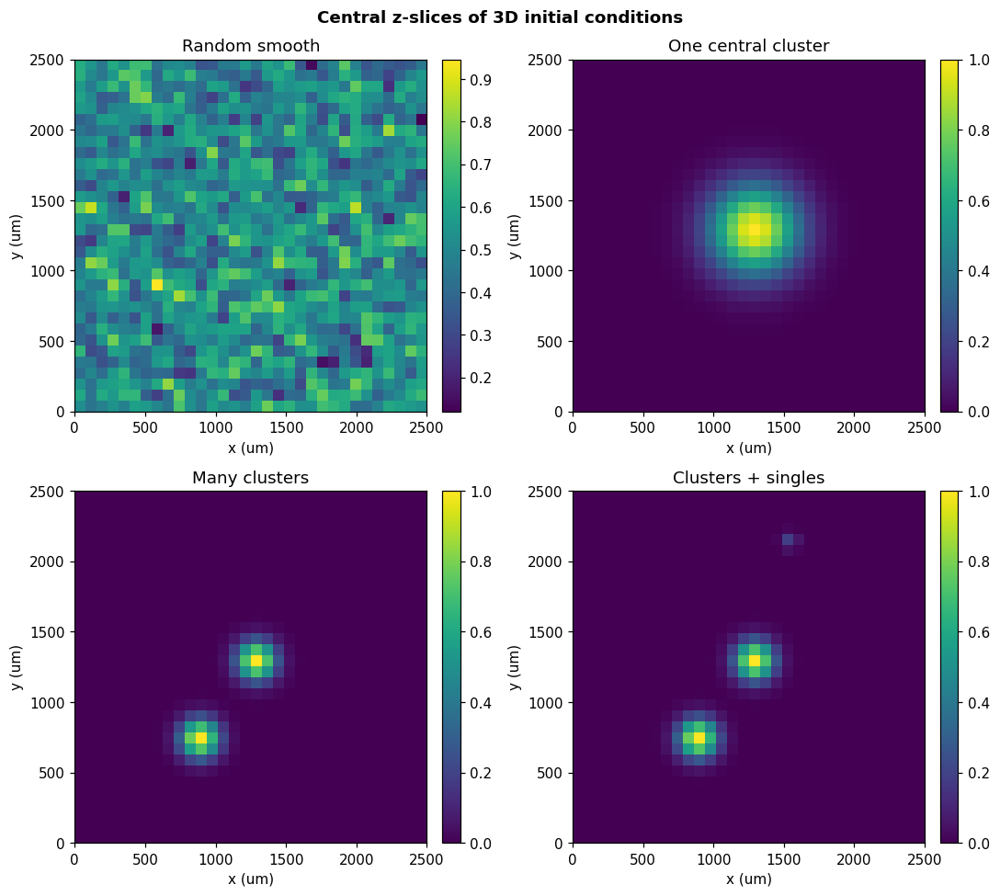

In [4]:

ICs=make_initial_conditions_3d()

mid=n//2
fig,axs=plt.subplots(2,2,figsize=(10,9))
for ax,(name,u0) in zip(axs.ravel(),ICs.items()):
    im=ax.imshow(u0[:,:,mid].T,origin="lower",extent=[0,L_um,0,L_um],aspect="equal")
    ax.set_title(name)
    ax.set_xlabel("x (um)")
    ax.set_ylabel("y (um)")
    fig.colorbar(im,ax=ax,fraction=.046,pad=.04)
fig.suptitle("Central z-slices of 3D initial conditions",fontweight="bold")
plt.tight_layout()
plt.show()


## 4. 3D Fourier symbols and exact linear evolution

In [5]:

# psd_synth/psd_3d.py


## 5. 3D radial PSD

In [6]:

# psd_synth/psd_3d.py



## 5A. Visualizing how the PDE changes the initial 3D condition

For each PDE, the initial volume \(u(\mathbf{x},0)\) is evolved using

\[
\widehat u(\mathbf{k},t+\Delta t)
=
\widehat u(\mathbf{k},t)e^{\lambda(\mathbf{k})\Delta t}.
\]

The plots below show the same evolution in three complementary ways:

1. **Absolute central \(z\)-slices** — preserve growth/decay amplitude.
2. **Normalized central \(z\)-slices** — emphasize morphology and spatial redistribution.
3. **Radial PSD curves** — show which spatial frequencies are amplified or suppressed.

This makes the effect of each PDE visible directly from the initial condition to later times.


In [7]:

# psd_synth/psd_3d.py



### Run the evolution plots

By default, the notebook plots seven representative PDEs for all four initial conditions.  
Set

```python
PLOT_EVOLUTION_FOR_ALL_MODELS = True
```

to generate the same plots for all 53 PDEs.


In [8]:

# Dependency check for the evolution plotting section
required_names = [
    "radial_psd_3d",
    "model_parameters",
    "simulate_linear_3d",
    "MODEL_LIBRARY",
    "MODEL_VARIANTS",
    "ICs"
]

missing=[name for name in required_names if name not in globals()]
if missing:
    raise RuntimeError(
        "Please run the notebook from the top before this section. "
        f"Missing definitions: {missing}"
    )

print("Evolution plotting dependencies are available.")


Evolution plotting dependencies are available.


Evolution: R+Diff | Random smooth


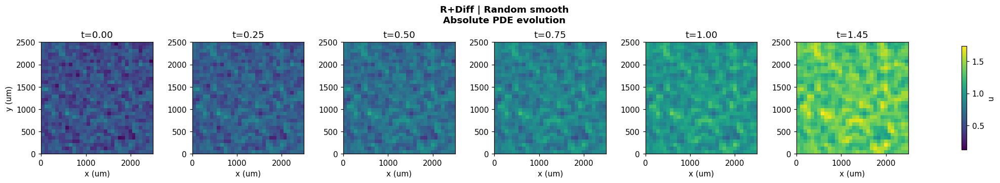

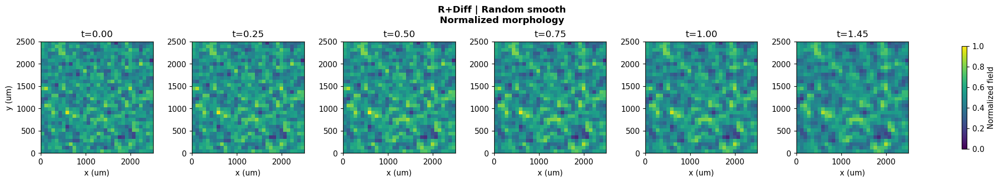

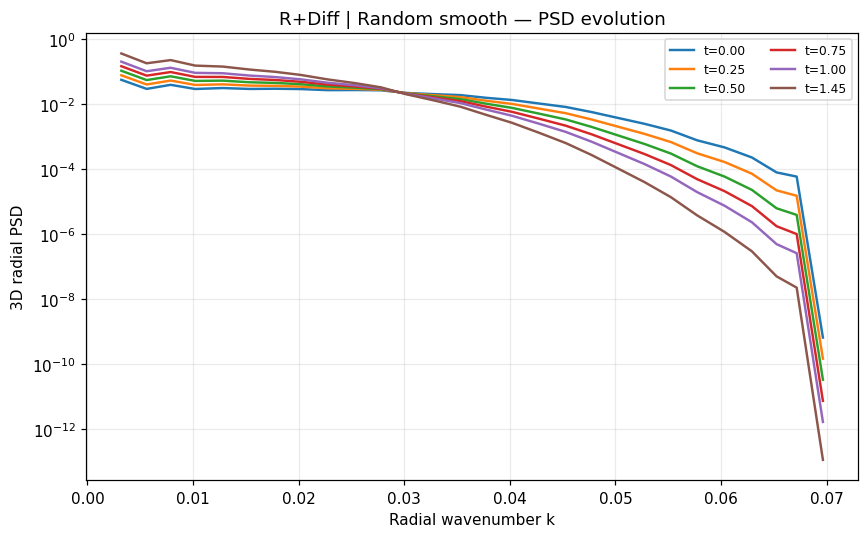

Evolution: R+Diff | One central cluster


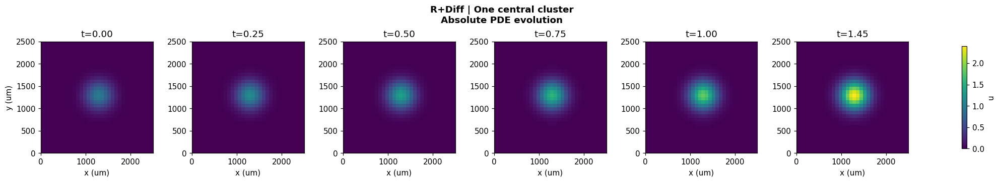

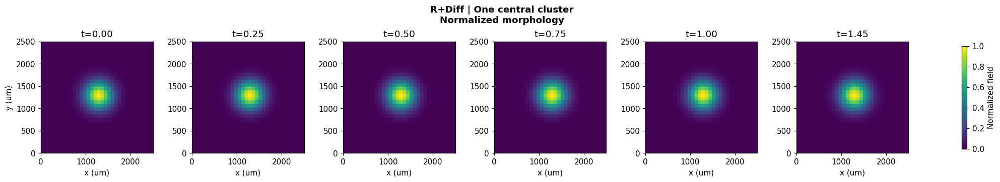

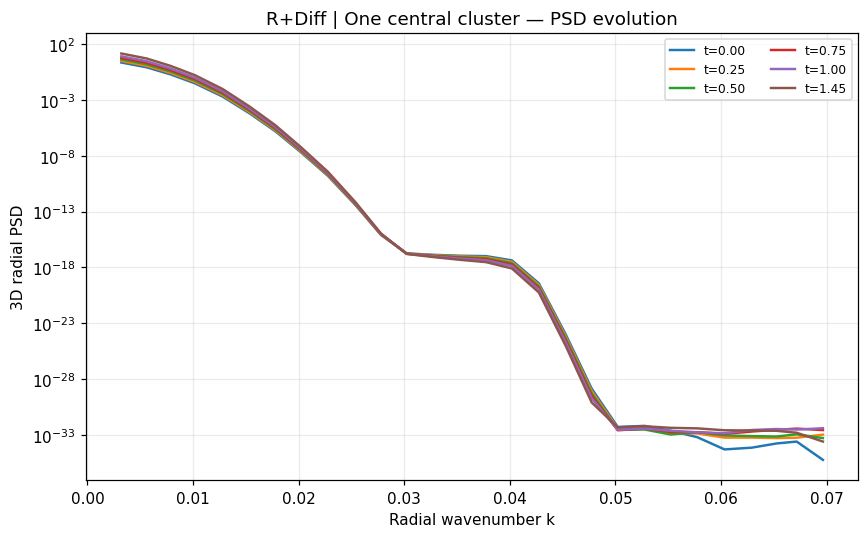

Evolution: R+Diff | Many clusters


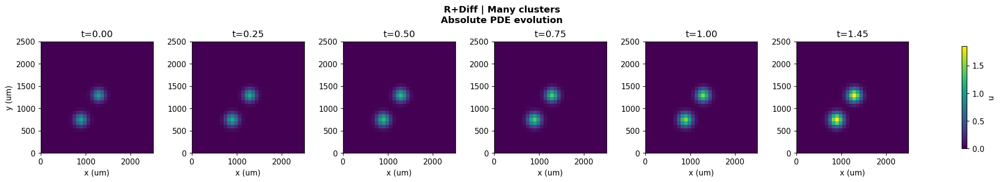

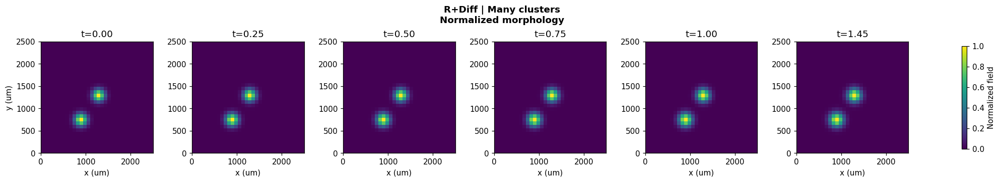

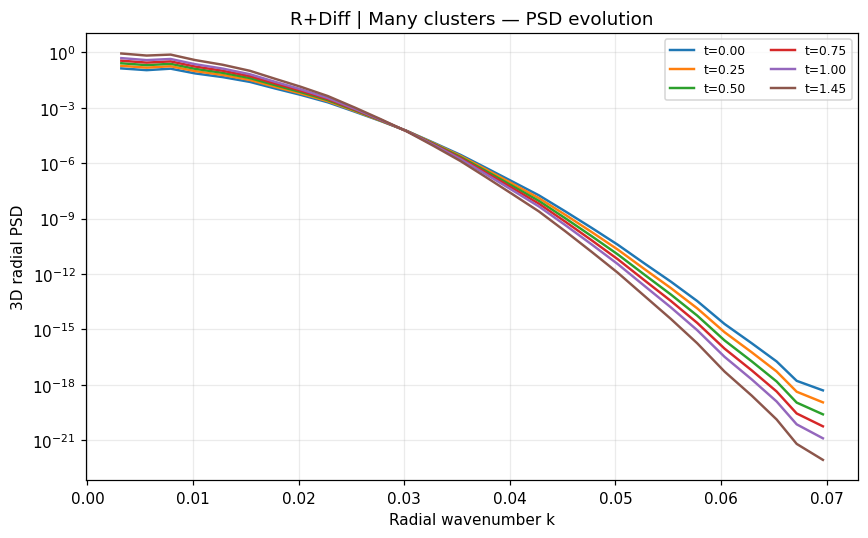

Evolution: R+Diff | Clusters + singles


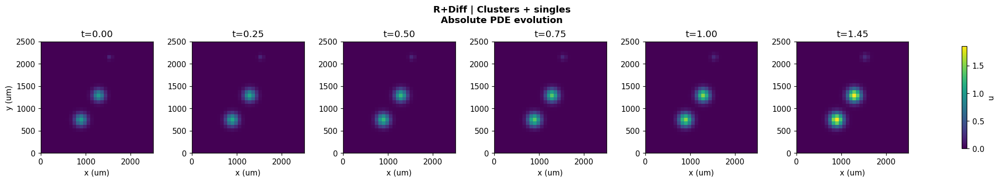

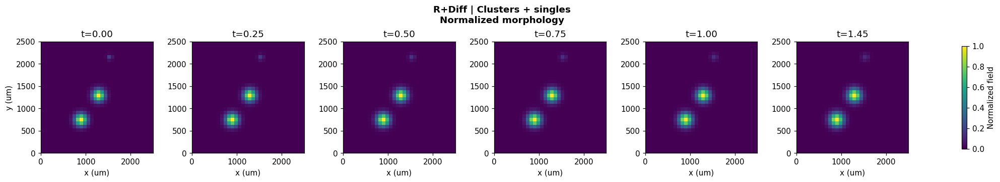

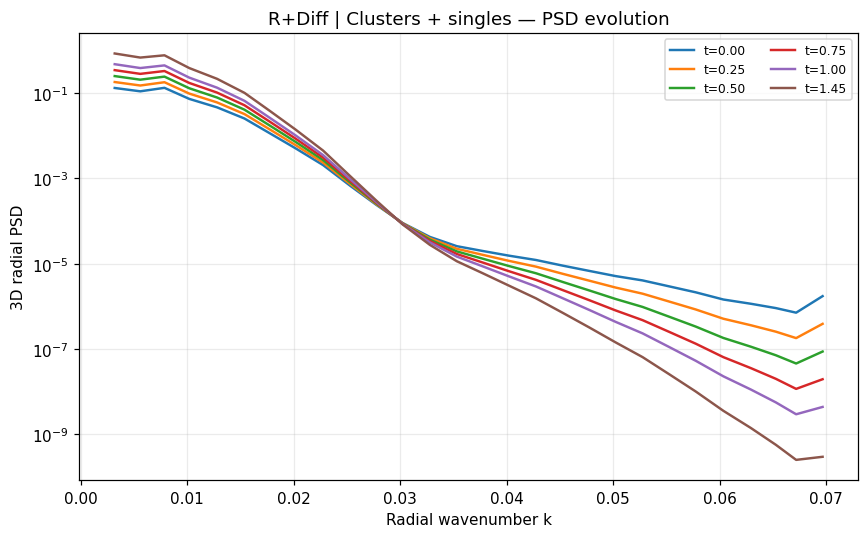

Evolution: R+Adv | Random smooth


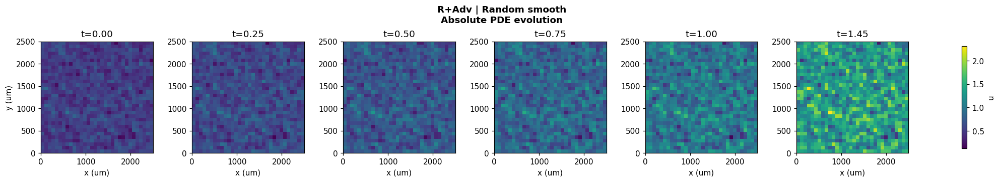

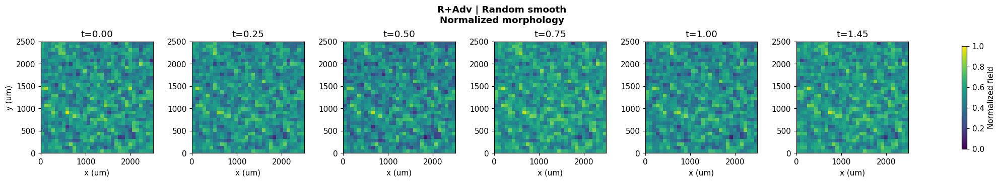

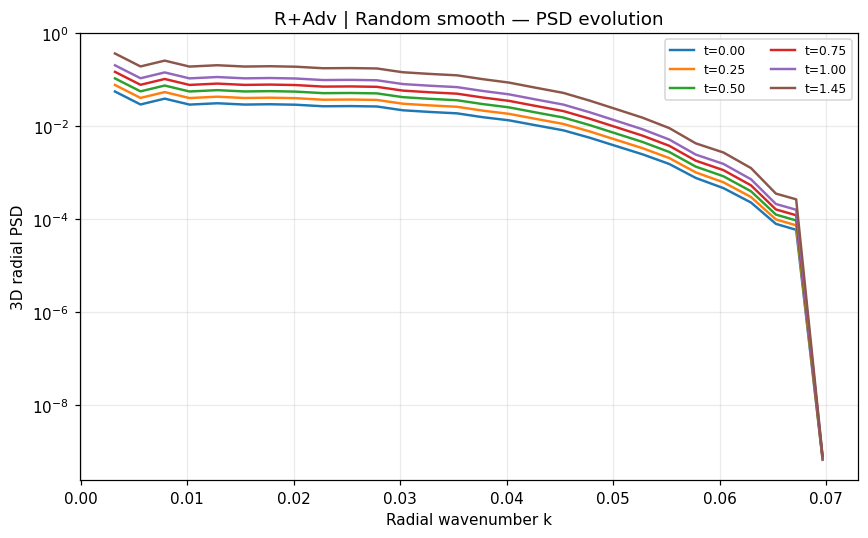

Evolution: R+Adv | One central cluster


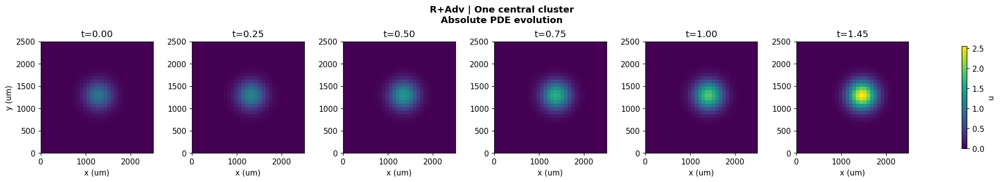

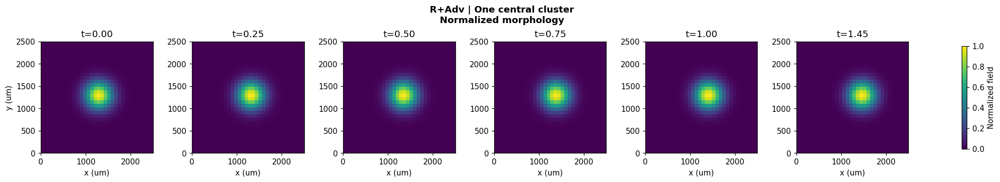

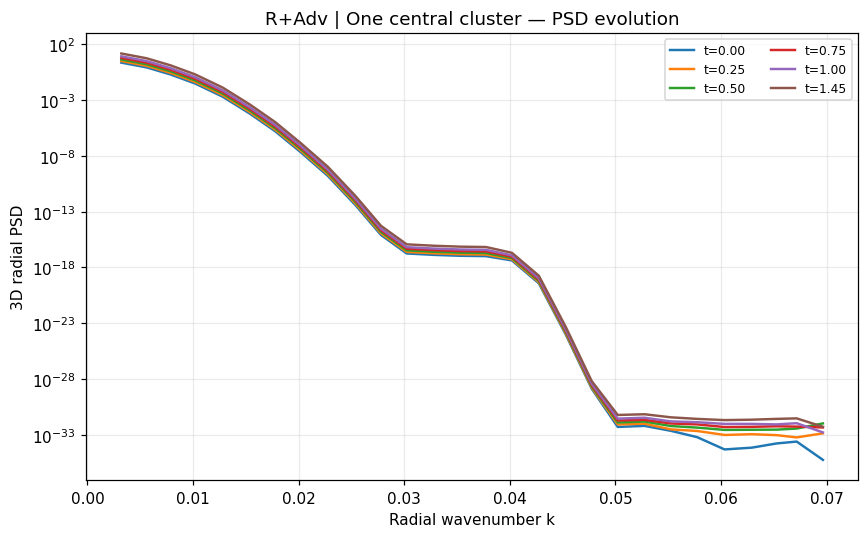

Evolution: R+Adv | Many clusters


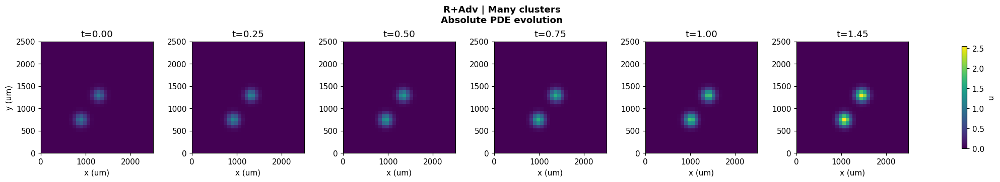

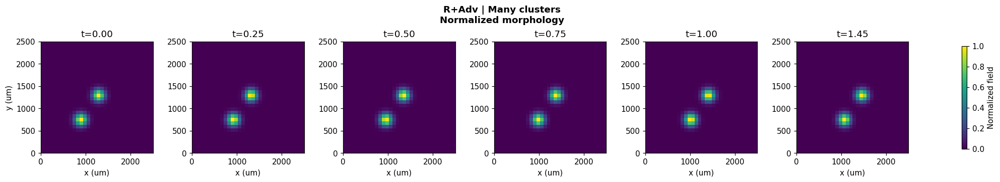

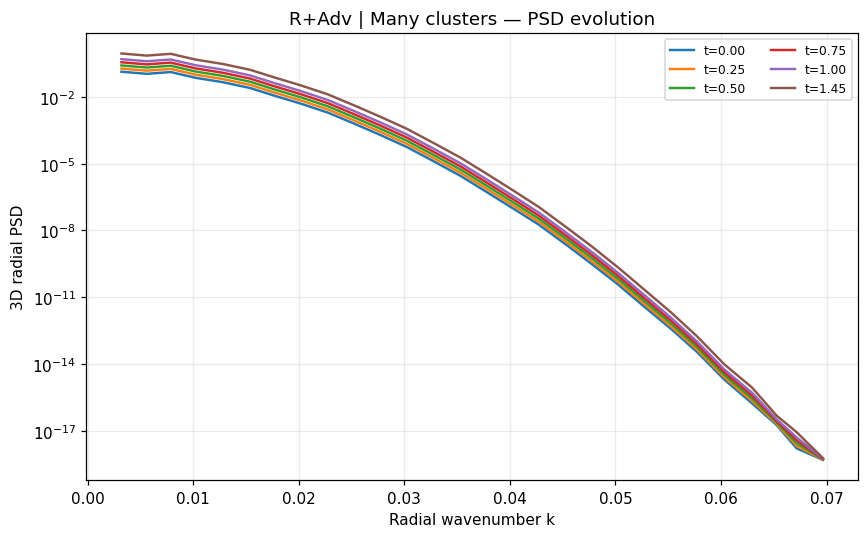

Evolution: R+Adv | Clusters + singles


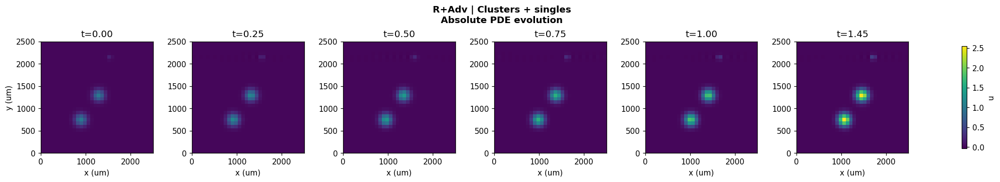

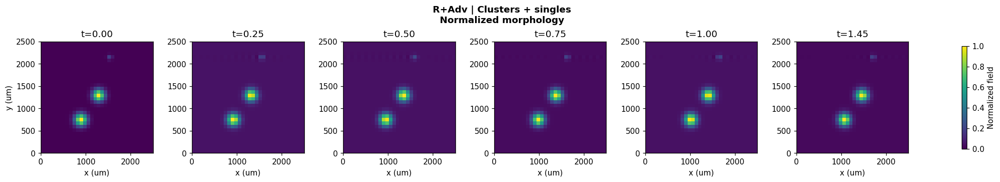

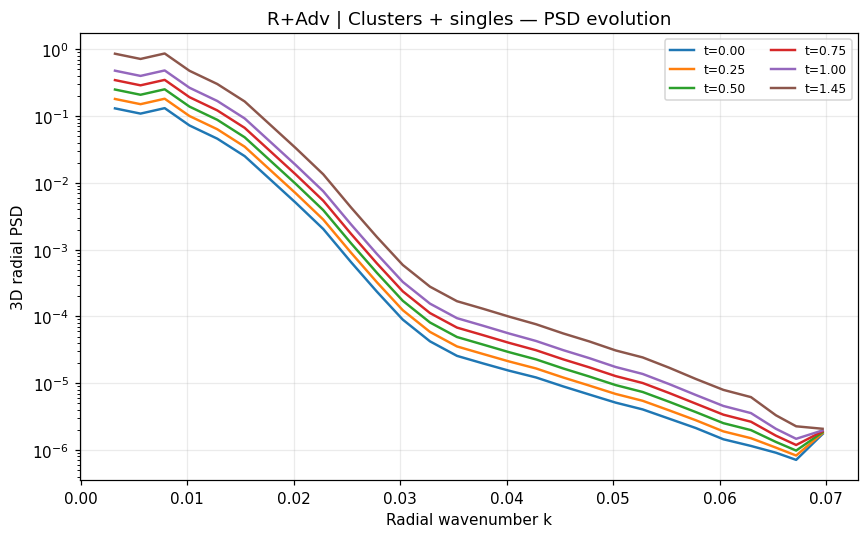

Evolution: R+Hyper | Random smooth


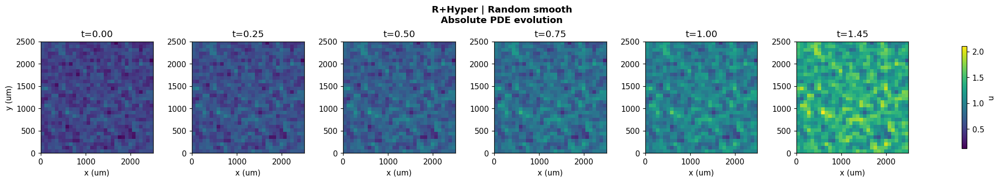

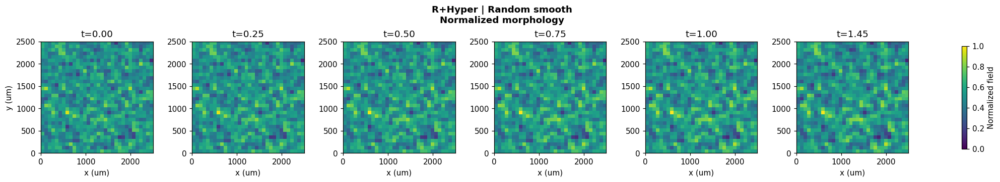

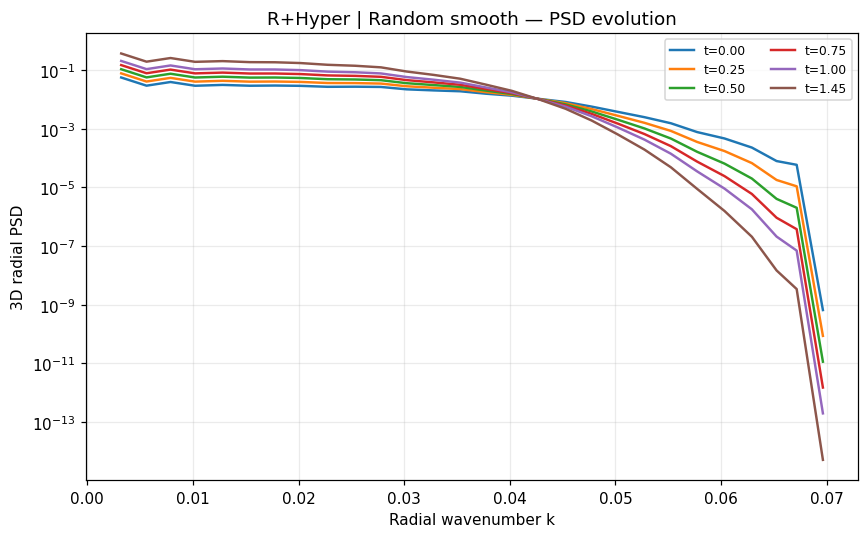

Evolution: R+Hyper | One central cluster


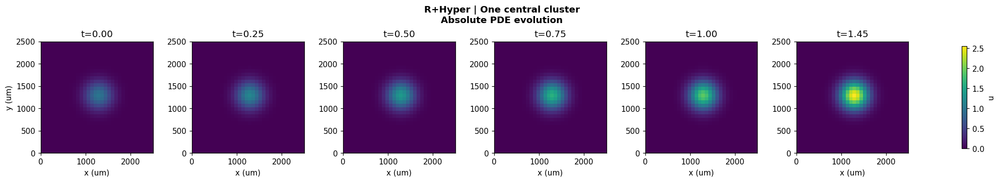

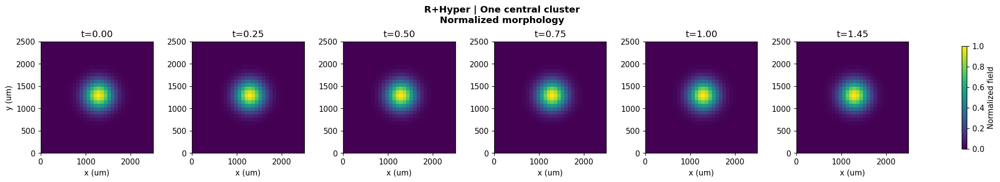

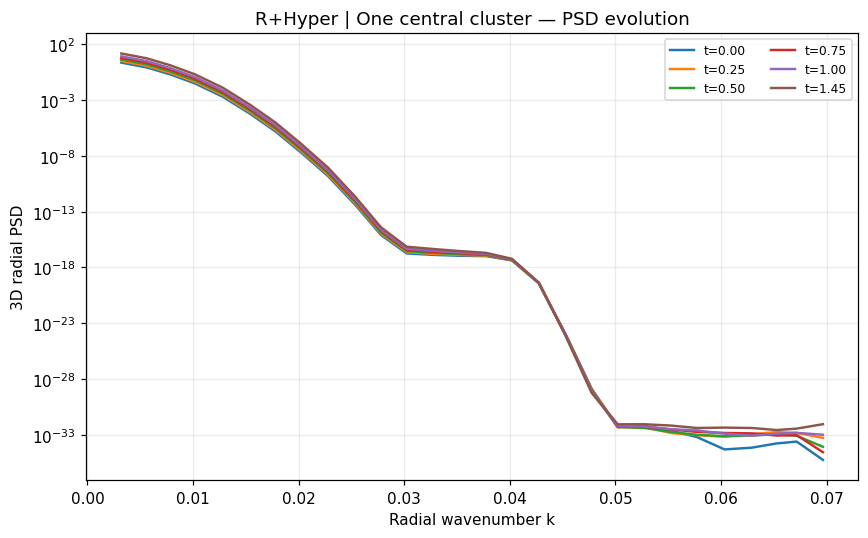

Evolution: R+Hyper | Many clusters


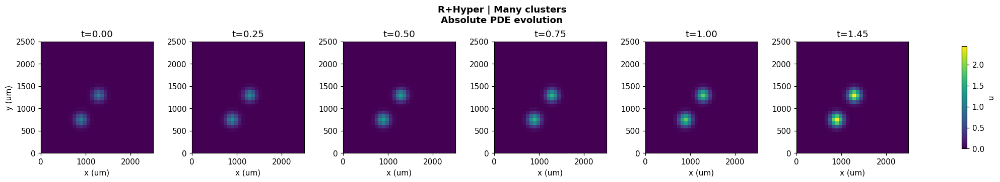

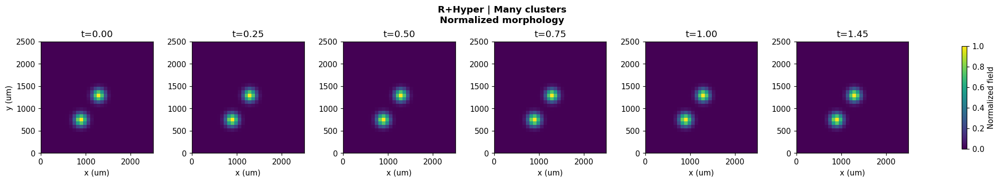

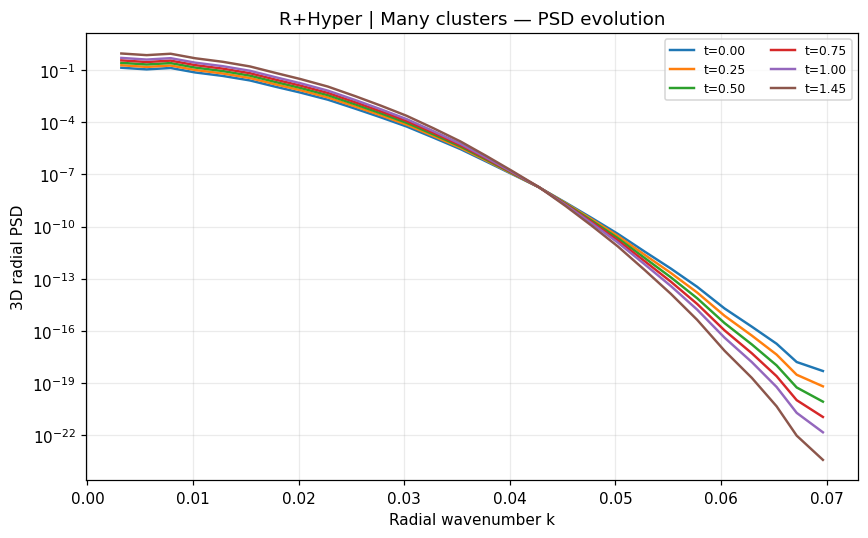

Evolution: R+Hyper | Clusters + singles


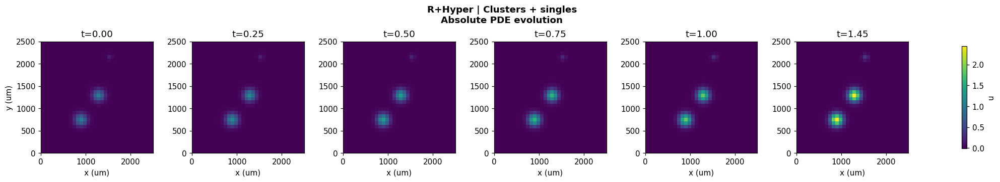

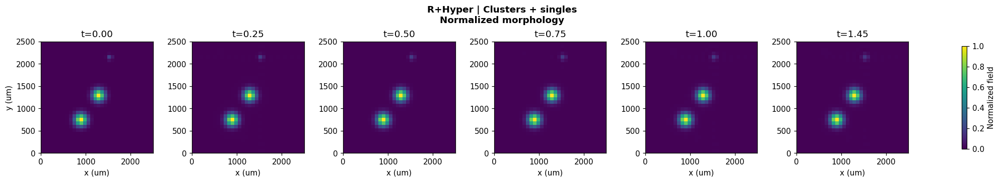

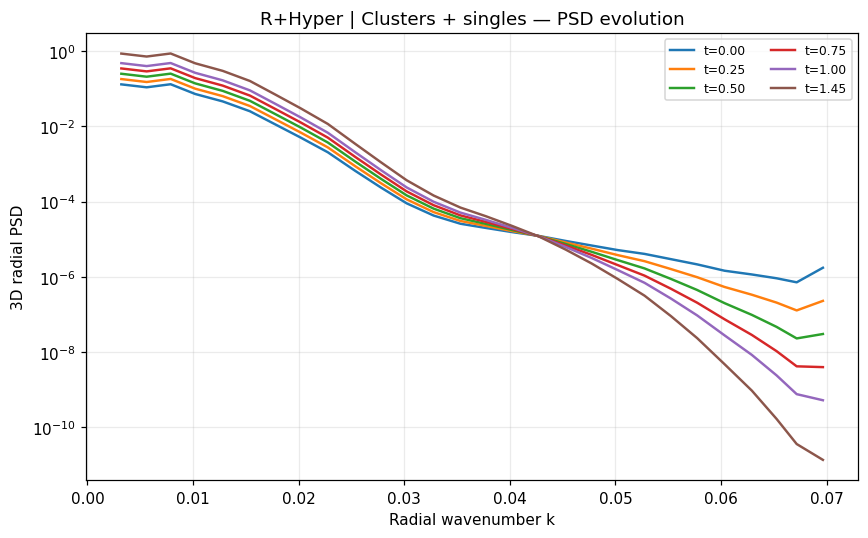

Evolution: R+SH | Random smooth


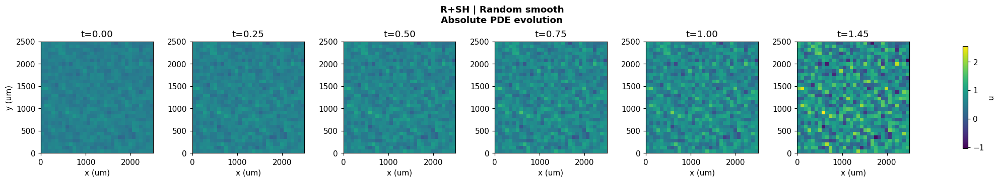

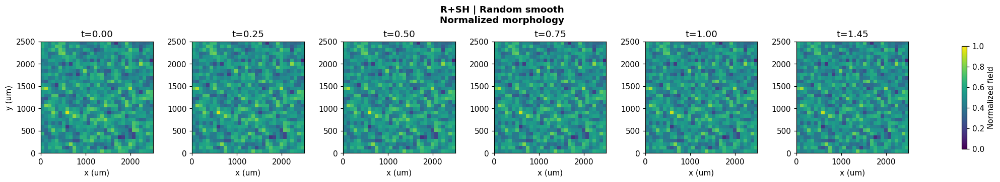

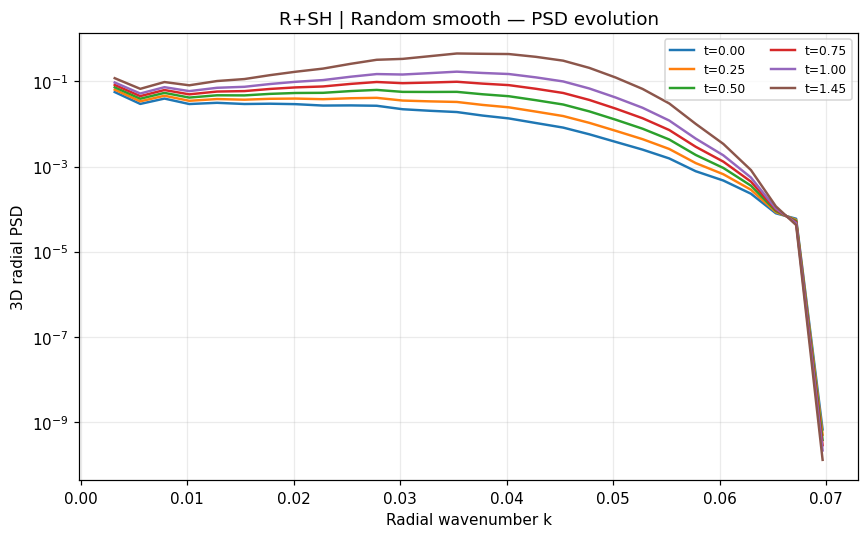

Evolution: R+SH | One central cluster


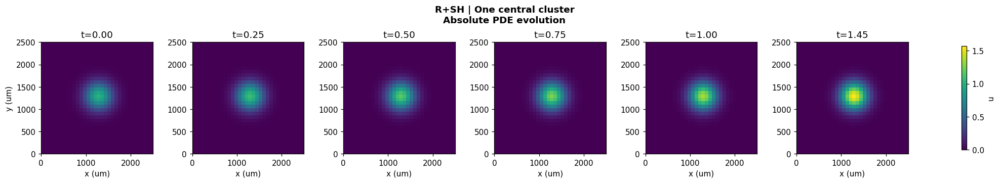

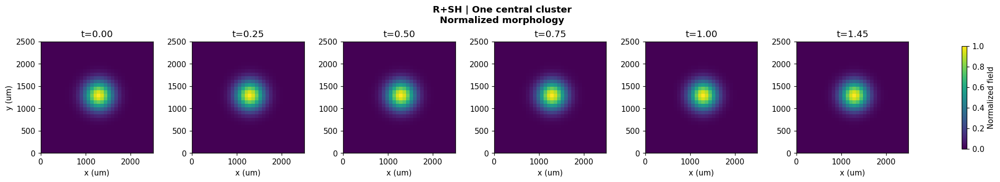

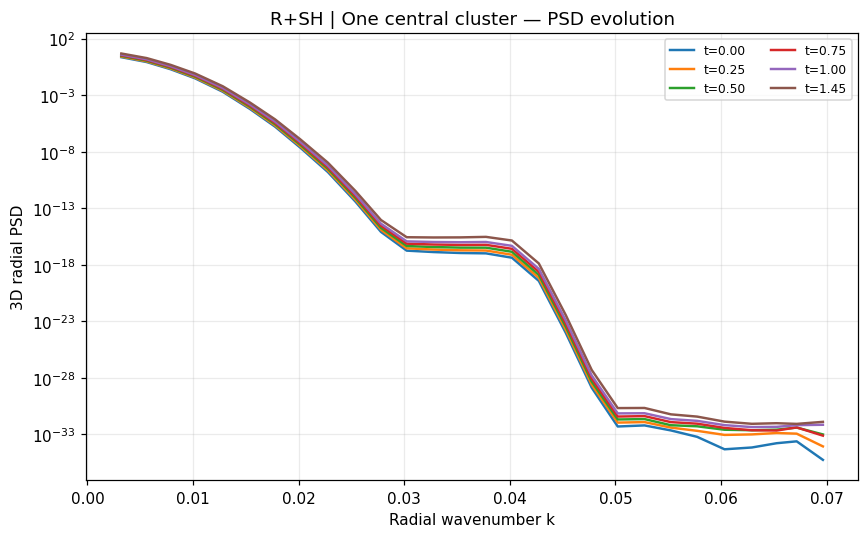

Evolution: R+SH | Many clusters


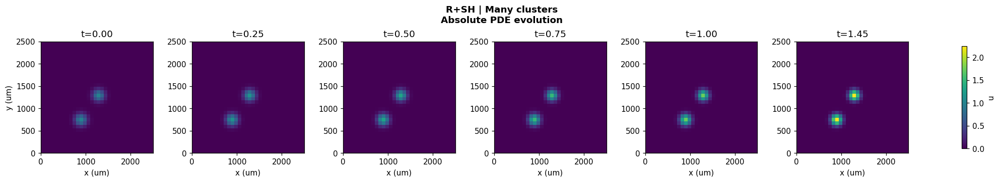

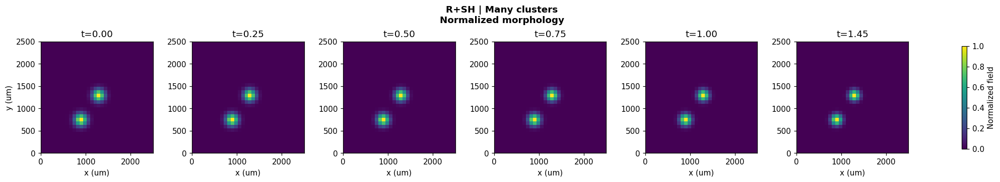

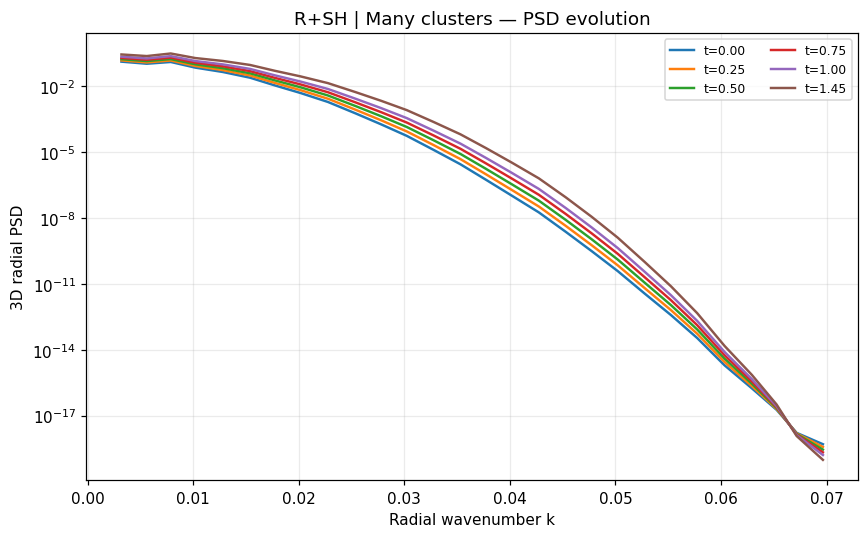

Evolution: R+SH | Clusters + singles


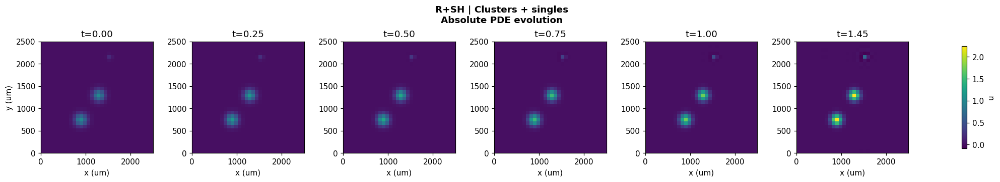

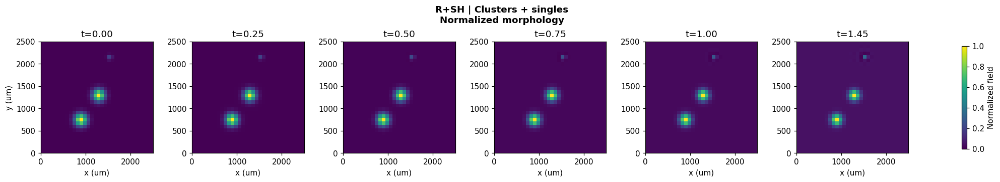

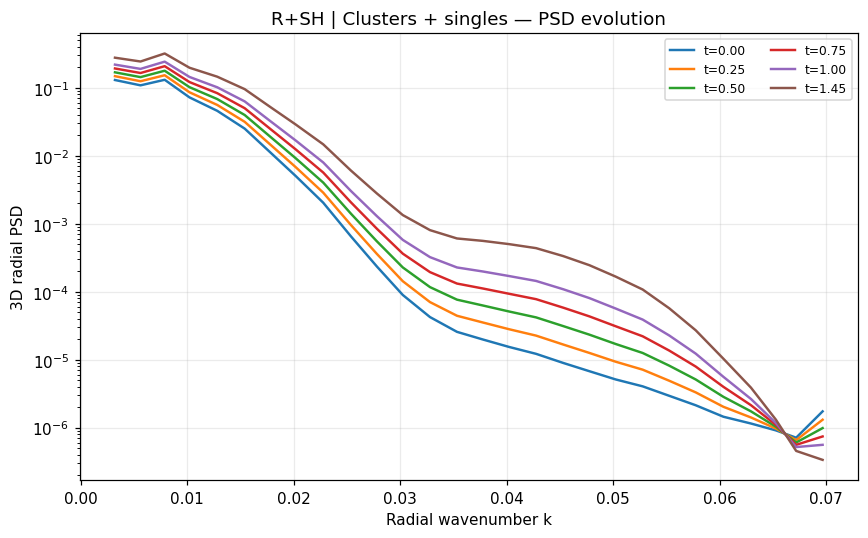

Evolution: R+FracDiff | Random smooth


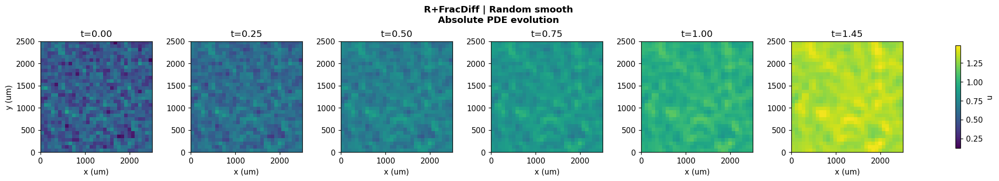

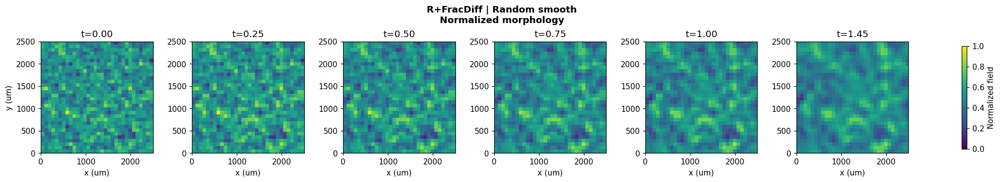

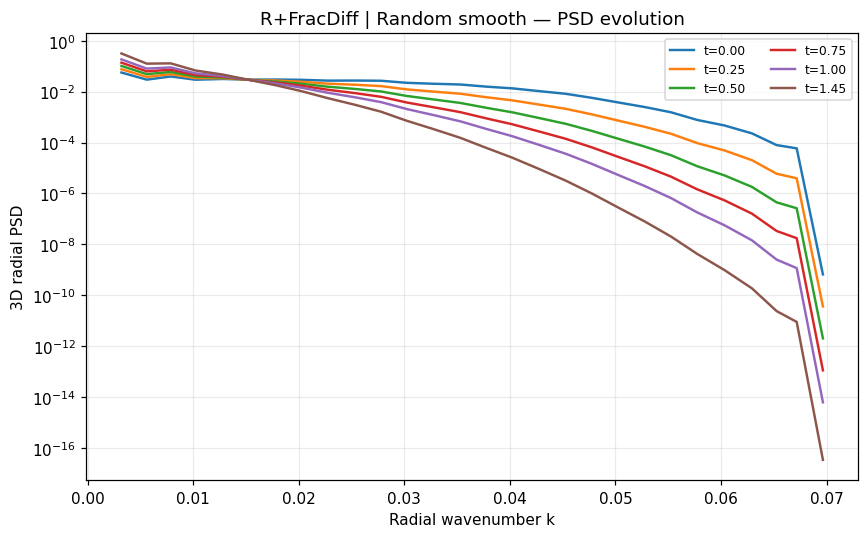

Evolution: R+FracDiff | One central cluster


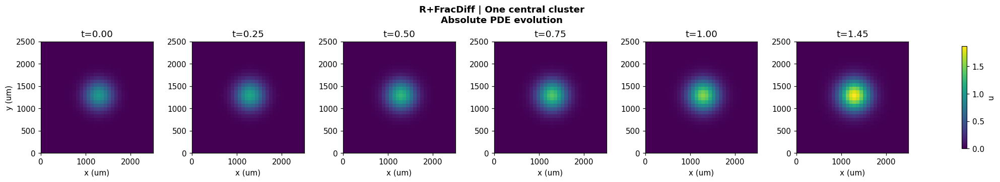

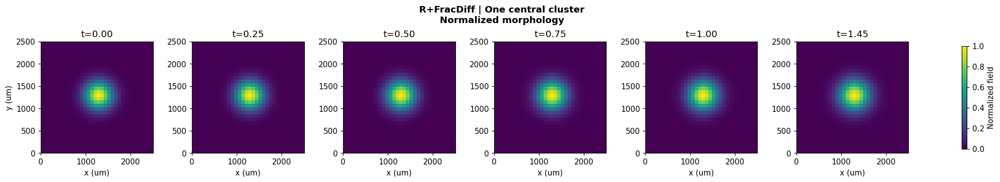

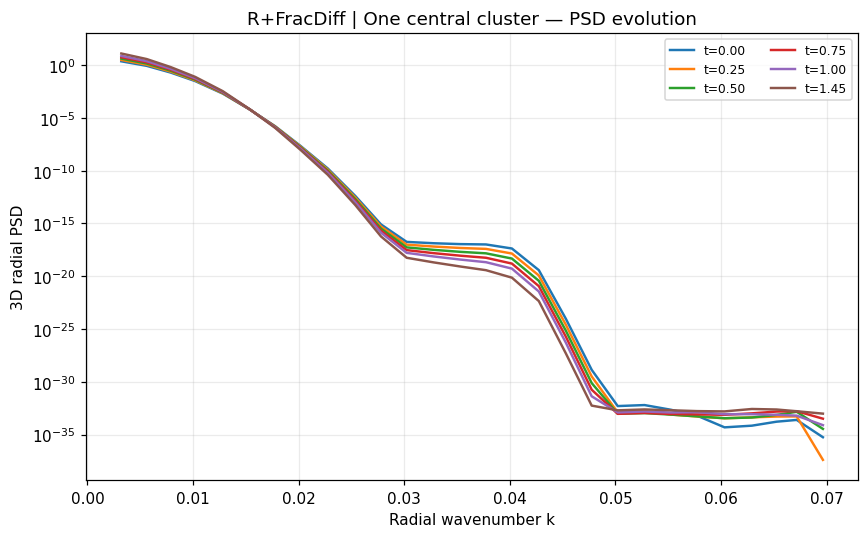

Evolution: R+FracDiff | Many clusters


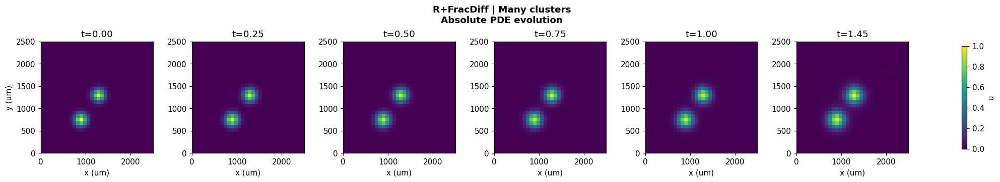

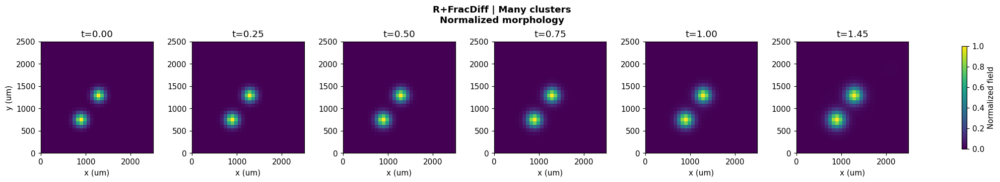

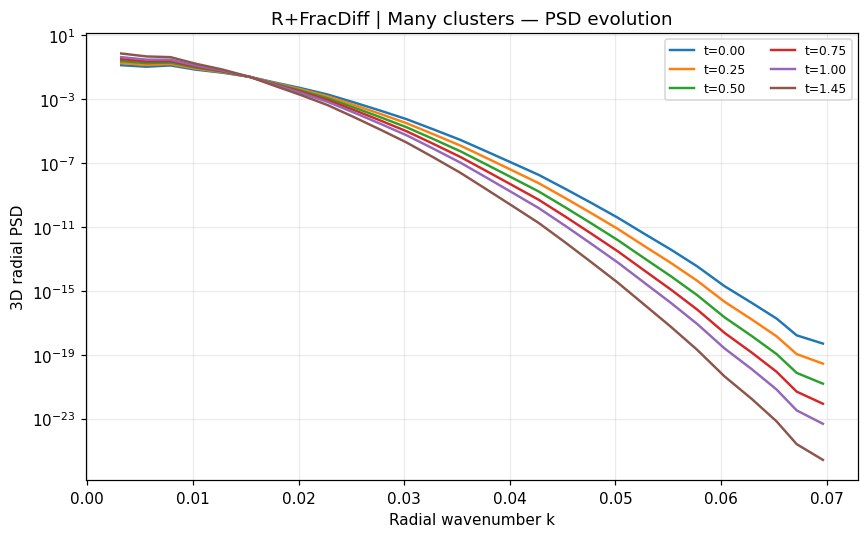

Evolution: R+FracDiff | Clusters + singles


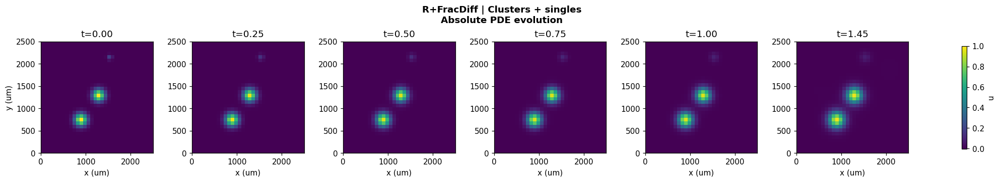

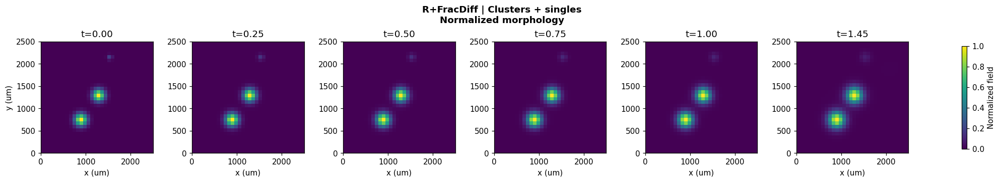

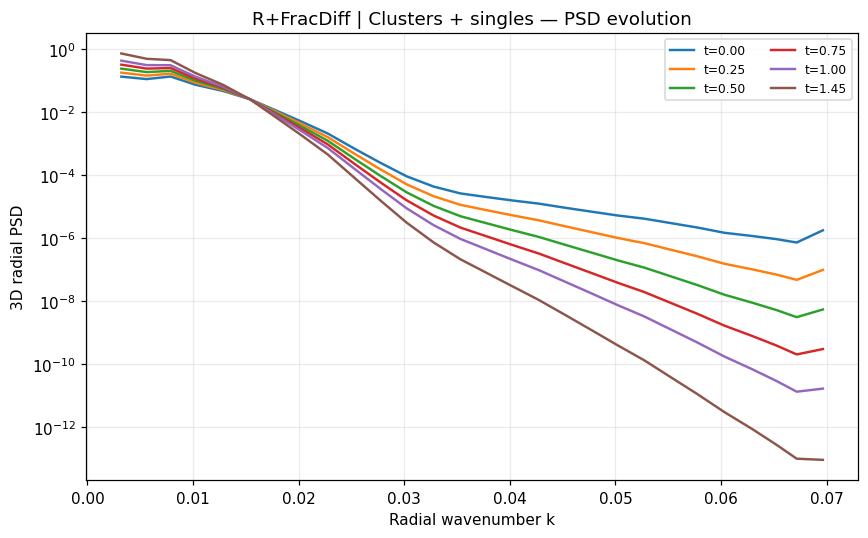

Evolution: R+KSlin | Random smooth


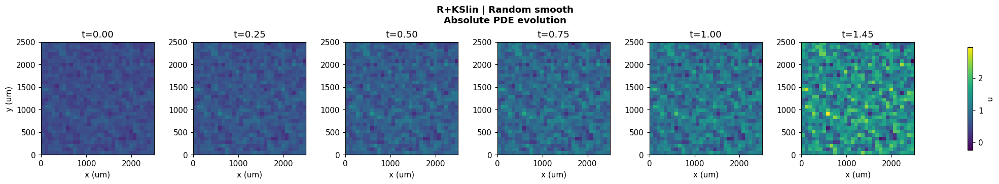

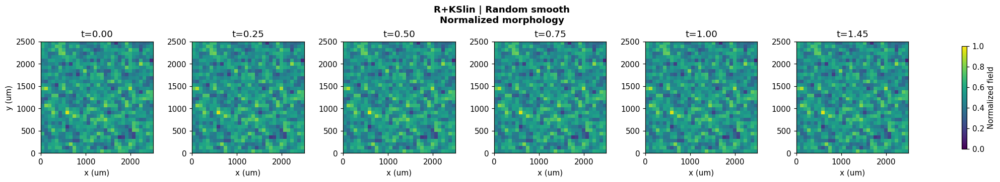

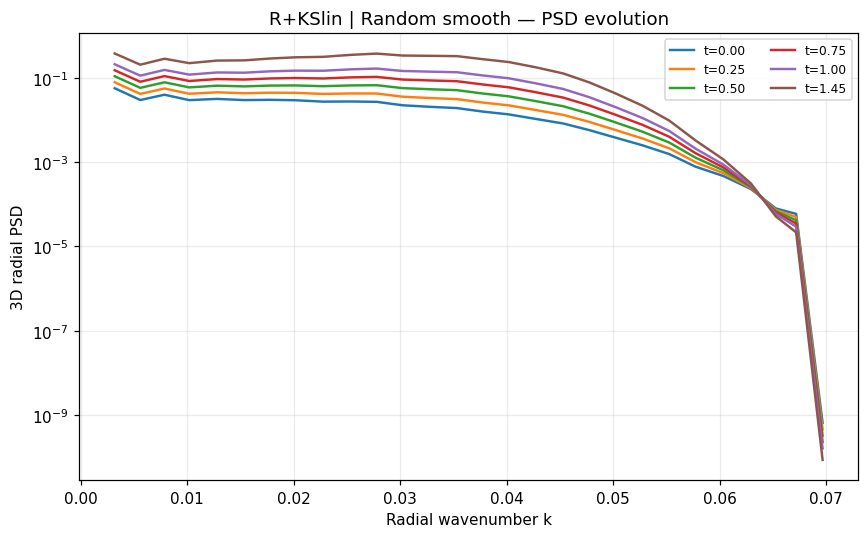

Evolution: R+KSlin | One central cluster


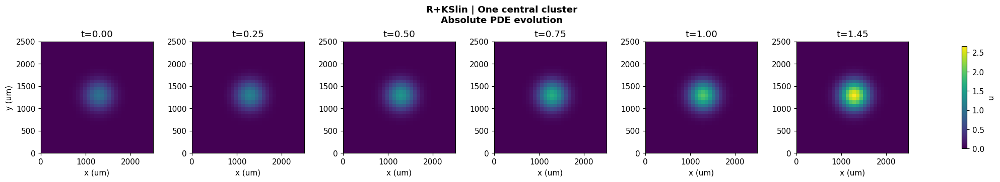

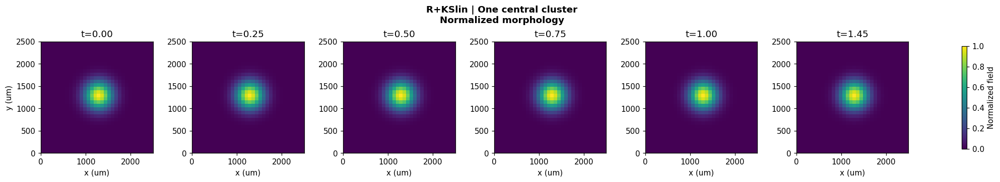

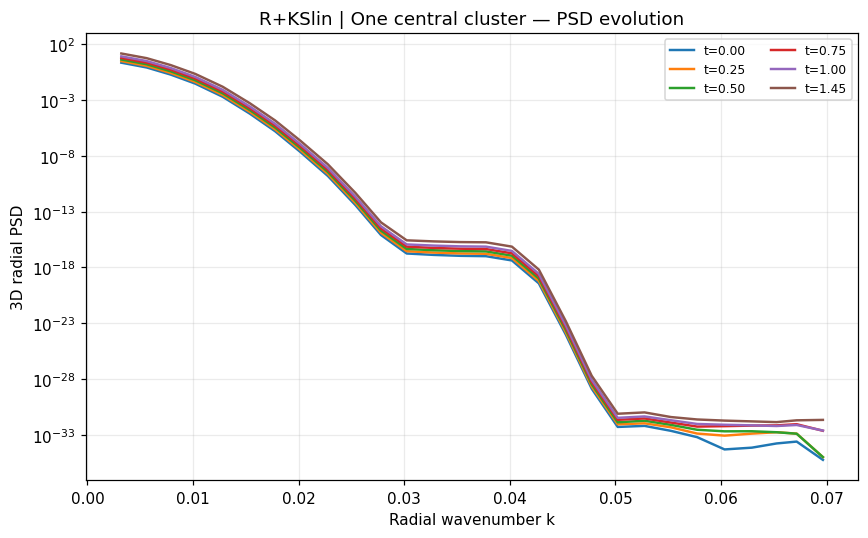

Evolution: R+KSlin | Many clusters


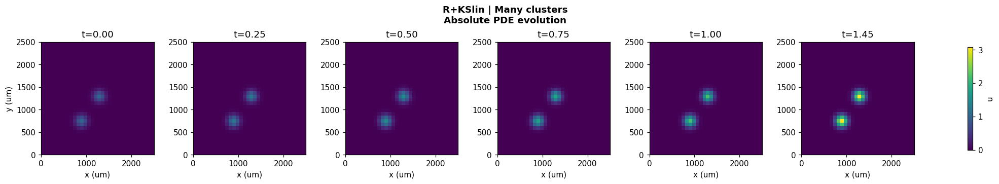

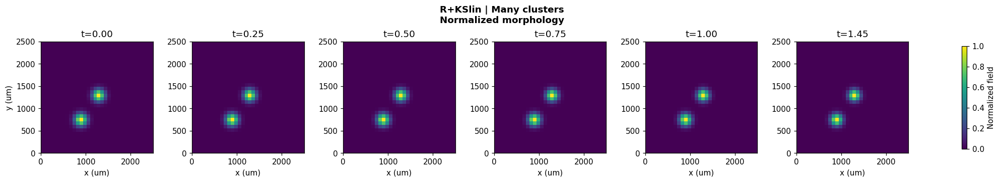

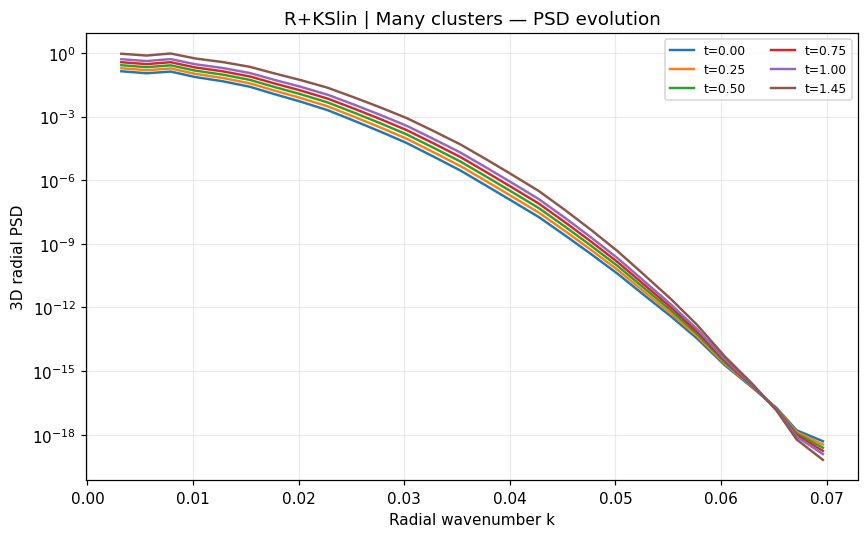

Evolution: R+KSlin | Clusters + singles


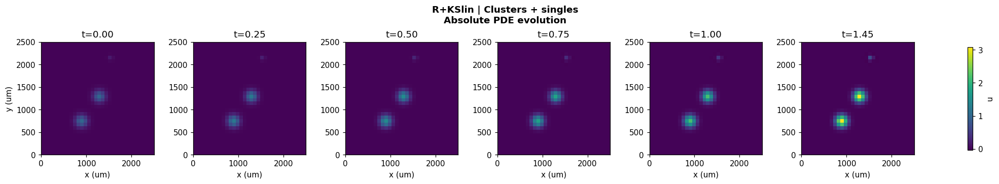

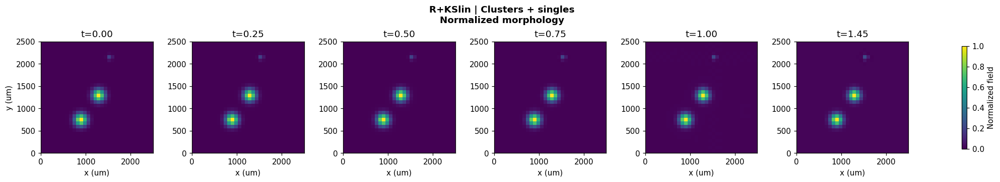

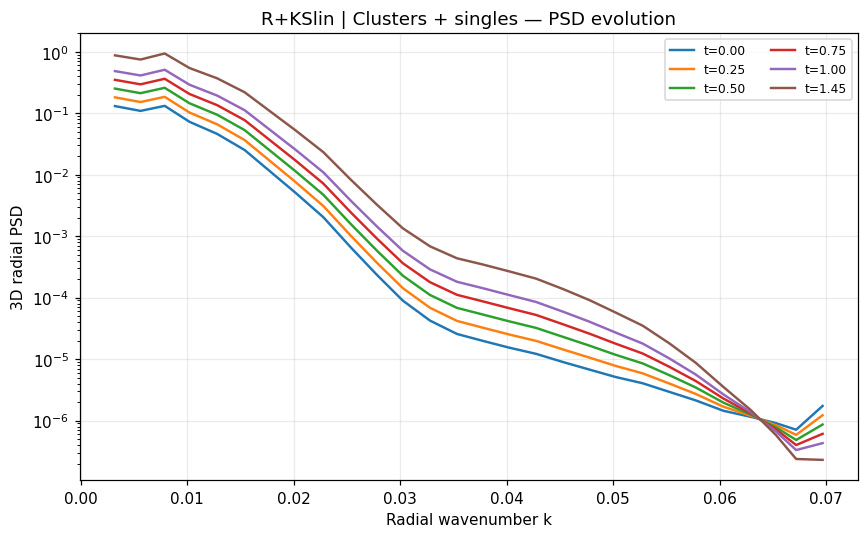

Evolution: CHlin | Random smooth


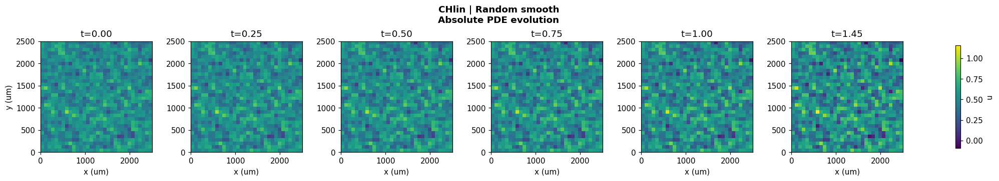

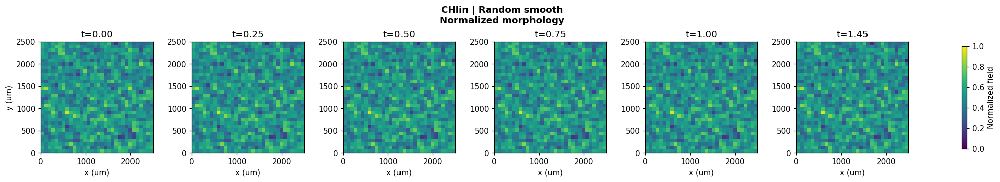

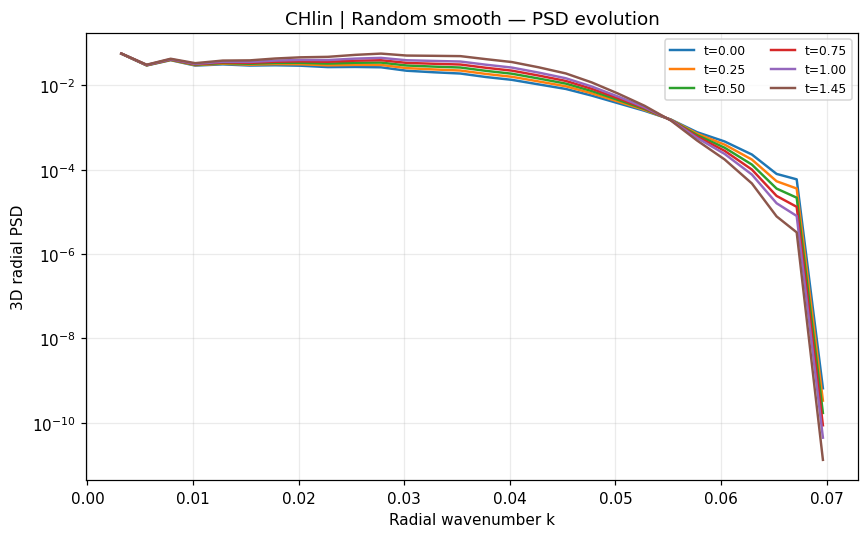

Evolution: CHlin | One central cluster


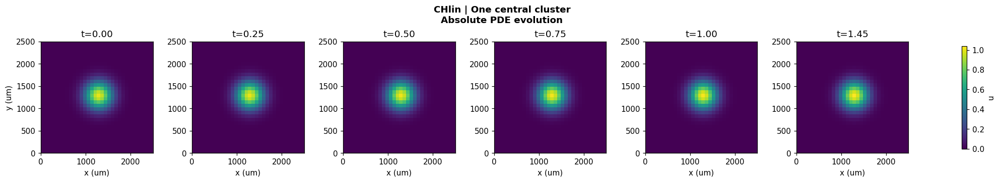

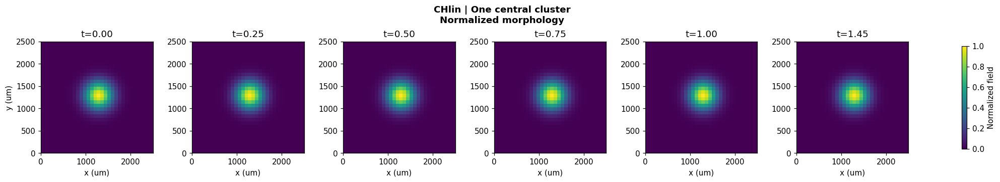

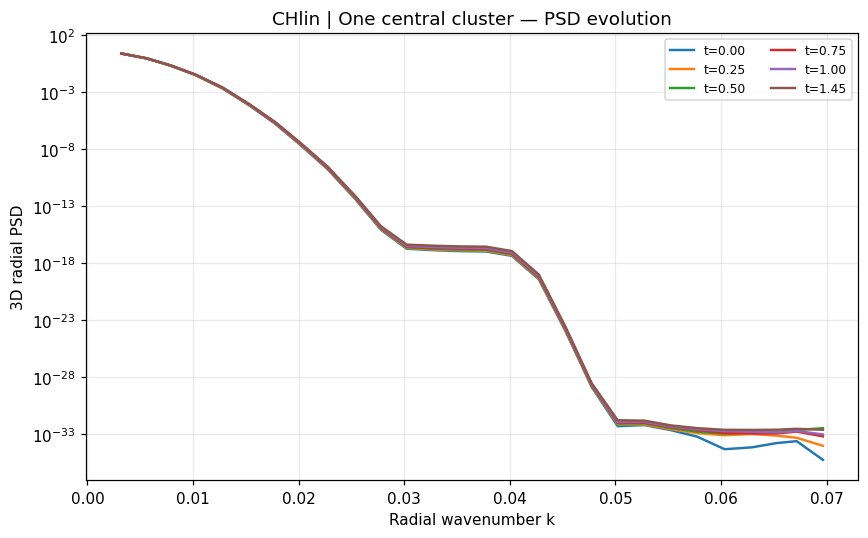

Evolution: CHlin | Many clusters


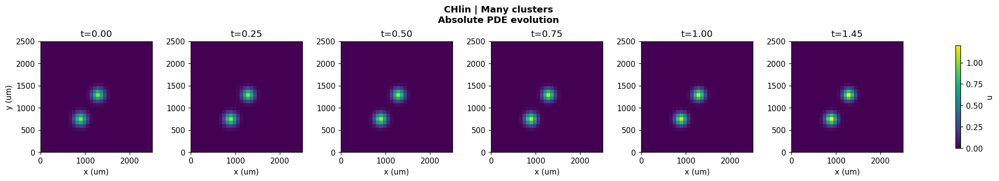

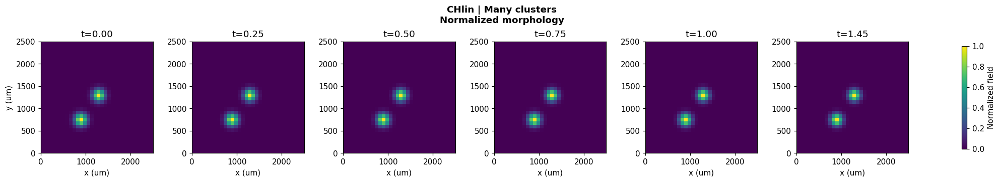

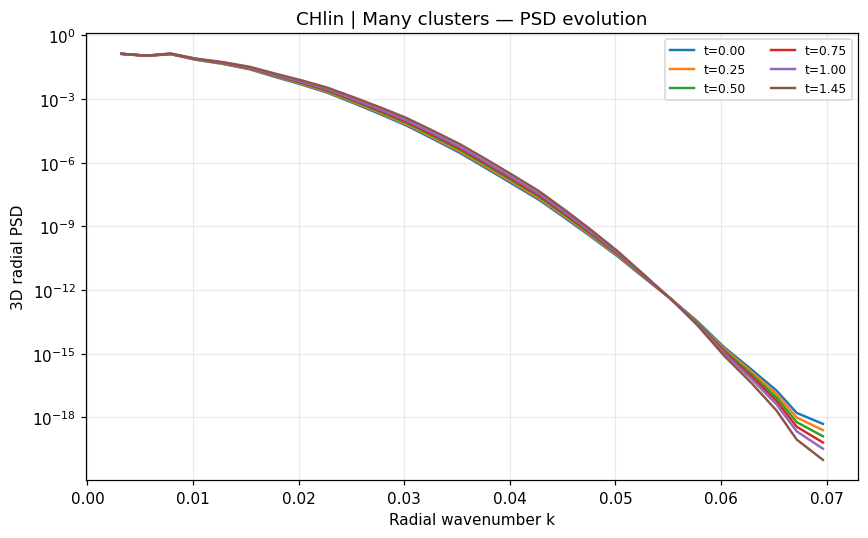

Evolution: CHlin | Clusters + singles


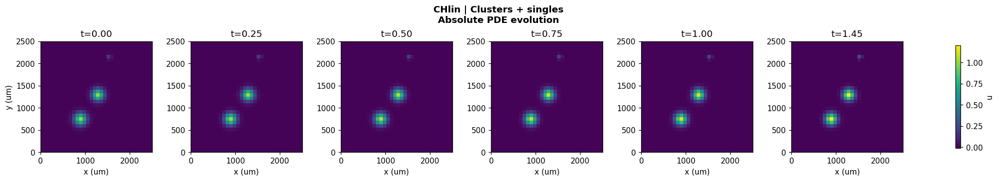

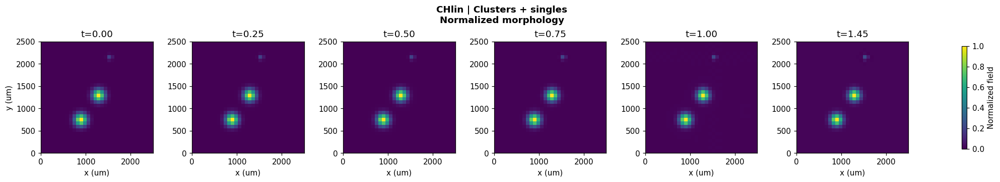

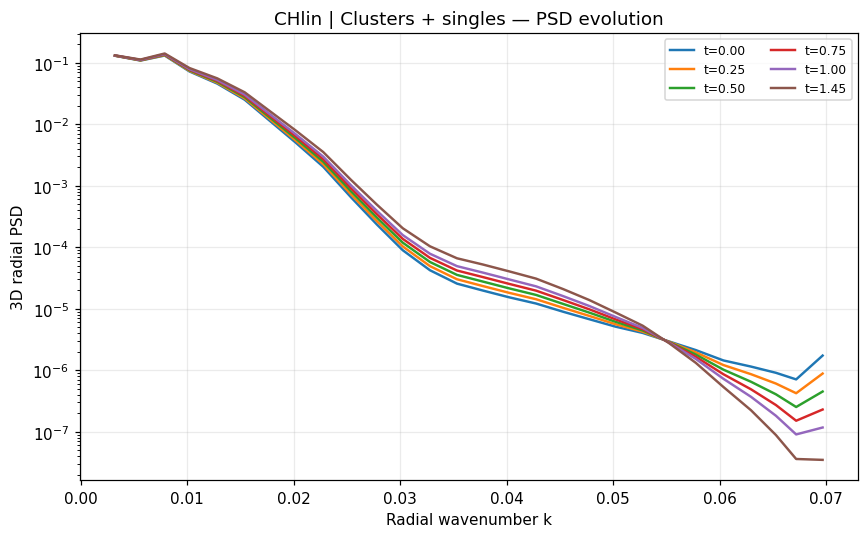

In [9]:

models_to_plot=MODEL_VARIANTS if PLOT_EVOLUTION_FOR_ALL_MODELS else EVOLUTION_MODELS

for tag in models_to_plot:
    if tag not in MODEL_LIBRARY:
        continue

    for ic_name,u0 in ICs.items():
        print(f"Evolution: {tag} | {ic_name}")
        _=plot_pde_evolution_3d(
            u0,
            tag,
            ic_name,
            frames=EVOLUTION_FRAMES,
            show_absolute=True,
            show_normalized=True,
            show_psd=True
        )
        plt.close("all")


## 6. Identifiability and parameter fitting

In [10]:

# psd_synth/psd_3d.py


## 7. Scenario 3: unknown elapsed time

In [11]:

# psd_synth/psd_3d.py


## 8. Scenarios 1–5

In [12]:

# psd_synth/psd_3d.py


## 9. Run all 53 PDEs across four 3D initial conditions

In [13]:

ALL_RESULTS={}

for model_index,tag in enumerate(MODEL_VARIANTS,1):
    p=model_parameters(tag)
    print(f"[{model_index:02d}/{len(MODEL_VARIANTS)}] {tag}")

    res={"tag":tag,"true":p,"S1":{},"S2":{},"S3":{},"S4":{},"S5":{}}

    for ic,u0 in ICs.items():
        try:
            stack=simulate_linear_3d(u0,tag,p)
        except Exception as e:
            print(" simulation failed:",ic,e)
            for s in ("S1","S2","S3","S4","S5"): res[s][ic]=None
            continue

        for s,func in [("S1",scenario1),("S2",scenario2),("S3",scenario3),
                       ("S4",scenario4),("S5",scenario5)]:
            try:
                res[s][ic]=func(stack,tag)
            except Exception as e:
                res[s][ic]=None
                print(f"  {ic} {s} failed: {type(e).__name__}: {e}")

        if RUN_PER_MODEL_FIGURES:
            mid=n//2
            fig,axs=plt.subplots(1,len(FRAME_LIST),figsize=(16,3))
            for ax,fid in zip(axs,FRAME_LIST):
                im=ax.imshow(stack[fid,:,:,mid].T,origin="lower",aspect="equal")
                ax.set_title(f"t={times[fid]:.2f}")
                ax.set_xticks([]); ax.set_yticks([])
            fig.suptitle(f"{tag} — {ic} — central z-slice")
            plt.tight_layout(); plt.show()

        del stack

    ALL_RESULTS[tag]=res

print("Finished",len(ALL_RESULTS),"PDEs.")


[01/53] R+Diff


[02/53] R+Adv


[03/53] R+Hyper


[04/53] R+SH


[05/53] R+FracDiff


[06/53] R+Disp


[07/53] R+Sixth


[08/53] R+Loss


[09/53] R+Nonlocal


[10/53] R+Diff+Adv


[11/53] R+Diff+Hyper


[12/53] R+Diff+SH


[13/53] R+Diff+FracDiff


[14/53] R+Diff+Disp


[15/53] R+Diff+Sixth


[16/53] R+Diff+Loss


[17/53] R+Diff+Nonlocal


[18/53] R+Adv+Hyper


[19/53] R+Adv+SH


[20/53] R+Adv+FracDiff


[21/53] R+Adv+Disp


[22/53] R+Adv+Sixth


[23/53] R+Adv+Loss


[24/53] R+Adv+Nonlocal


[25/53] R+Hyper+SH


[26/53] R+Hyper+FracDiff


[27/53] R+Hyper+Disp


[28/53] R+Hyper+Sixth


[29/53] R+Hyper+Loss


[30/53] R+Hyper+Nonlocal


[31/53] R+SH+FracDiff


[32/53] R+SH+Disp


[33/53] R+SH+Sixth


[34/53] R+SH+Loss


[35/53] R+SH+Nonlocal


[36/53] R+FracDiff+Disp


[37/53] R+FracDiff+Sixth


[38/53] R+FracDiff+Loss


[39/53] R+FracDiff+Nonlocal


[40/53] R+Disp+Sixth


[41/53] R+Disp+Loss


[42/53] R+Disp+Nonlocal


[43/53] R+Sixth+Loss


[44/53] R+Sixth+Nonlocal


[45/53] R+Loss+Nonlocal


[46/53] R+Diff+Adv+Hyper


[47/53] R+Diff+Adv+SH


[48/53] R+Diff+Hyper+SH


[49/53] R+Adv+Hyper+SH


[50/53] R+Diff+Adv+Hyper+SH


[51/53] R+KSlin


[52/53] CHlin


[53/53] R+Mixed


Finished 53 PDEs.


## 10. Detailed 3D Scenario-5 reaction–diffusion grid sweep

,Initial condition,Grid,Cubes,Median log10(D/R),True log10(D/R),Error,Good cubes,Total fitted cubes
0,Random smooth,2,8,3.0951,3.0621,0.0329,8,8
1,Random smooth,3,27,3.0452,3.0621,-0.0170,27,27
2,Random smooth,4,64,2.9973,3.0621,-0.0648,64,64
3,One central cluster,2,8,3.0761,3.0621,0.0140,8,8
4,One central cluster,3,27,3.0527,3.0621,-0.0095,27,27
5,One central cluster,4,64,2.8601,3.0621,-0.2021,64,64
6,Many clusters,2,8,3.0659,3.0621,0.0038,8,8
7,Many clusters,3,27,3.2735,3.0621,0.2114,26,27
8,Many clusters,4,64,2.9597,3.0621,-0.1024,54,64
9,Clusters + singles,2,8,3.0659,3.0621,0.0037,8,8


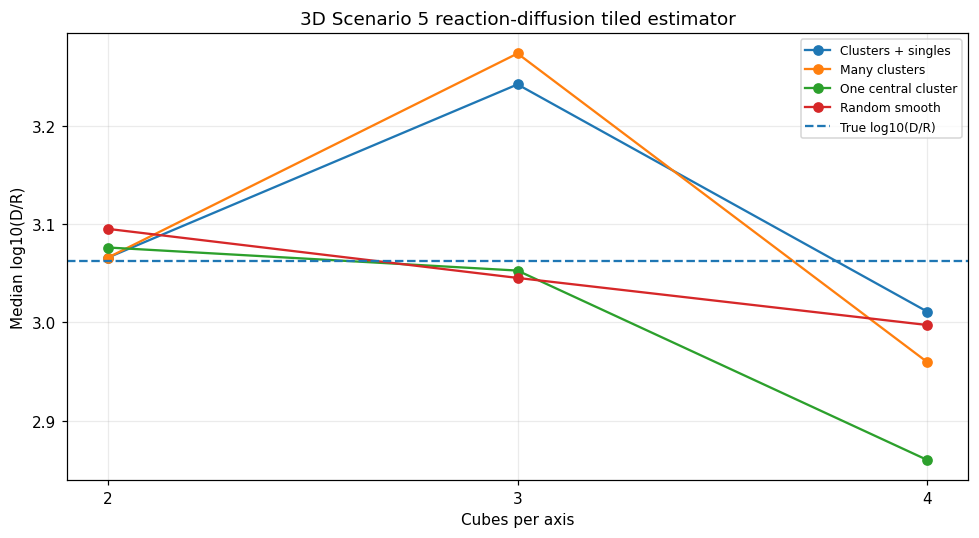

In [14]:
S5_RD_TAG="R+Diff"
R_TRUE=MODEL_LIBRARY[S5_RD_TAG]["true"]["R"]
D_TRUE=MODEL_LIBRARY[S5_RD_TAG]["true"]["D"]
TRUE_LOG10_DR=np.log10(D_TRUE/R_TRUE)
ELAPSED_S5=times[SNAP_FRAME]

rows=[]
for ic,u0 in ICs.items():
    stack=simulate_linear_3d(u0,S5_RD_TAG,MODEL_LIBRARY[S5_RD_TAG]["true"])
    vol=stack[SNAP_FRAME]
    for grid_n in GRID_LIST:
        rr=fit_tiled_RD_3d(vol,R_TRUE,ELAPSED_S5,grid_n)
        rows.append({
            "Initial condition":ic,
            "Grid":grid_n,
            "Cubes":grid_n**3,
            "Median log10(D/R)":rr["median"] if rr else np.nan,
            "True log10(D/R)":TRUE_LOG10_DR,
            "Error":rr["median"]-TRUE_LOG10_DR if rr and np.isfinite(rr["median"]) else np.nan,
            "Good cubes":rr["n_good"] if rr else 0,
            "Total fitted cubes":rr["n_total"] if rr else 0
        })
    del stack

S5_RD_GRID_DF=pd.DataFrame(rows)
display(S5_RD_GRID_DF.round(4))

fig,ax=plt.subplots(figsize=(9,5))
for ic,grp in S5_RD_GRID_DF.groupby("Initial condition"):
    grp=grp.sort_values("Grid")
    ax.plot(grp["Grid"],grp["Median log10(D/R)"],marker="o",label=ic)
ax.axhline(TRUE_LOG10_DR,linestyle="--",label="True log10(D/R)")
ax.set_xlabel("Cubes per axis")
ax.set_ylabel("Median log10(D/R)")
ax.set_xticks(GRID_LIST)
ax.grid(alpha=.25)
ax.legend(fontsize=8)
ax.set_title("3D Scenario 5 reaction-diffusion tiled estimator")
plt.tight_layout()
plt.show()


## 11. Master summary: 53 PDEs × 5 scenarios × 4 initial conditions

In [15]:
MASTER_ROWS=[]

for tag,res in ALL_RESULTS.items():
    for scen in ("S1","S2","S3","S4","S5"):
        for ic in ICs:
            rr=res[scen].get(ic)
            row={
                "PDE":tag,
                "Operators":" + ".join(MODEL_LIBRARY[tag]["ops"]),
                "Scenario":scen,
                "Initial condition":ic,
                "True parameters":fmt_dict(res["true"]),
                "Recovered / metric":"",
                "R2":np.nan,
                "Median abs parameter error (%)":np.nan,
                "Good cubes":np.nan,
                "Total cubes":np.nan,
                "PSD-invisible":"; ".join(invisible_names(tag)),
                "Status":""
            }

            if rr is None:
                row["Status"]="failed / unavailable"
            elif scen in ("S1","S2"):
                row["Recovered / metric"]=fmt_dict(rr["fit"])
                row["R2"]=rr["R2"]
                errs=[]
                for nm,est in rr["fit"].items():
                    tv=true_identifiable_value(tag,nm)
                    if np.isfinite(tv) and abs(tv)>1e-30:
                        errs.append(abs(relative_error(est,tv)))
                row["Median abs parameter error (%)"]=np.nanmedian(errs) if errs else np.nan
                row["Status"]="known-time radial-PSD symbol recovery"
            elif scen=="S3":
                row["Recovered / metric"]=fmt_dict(rr["recovered"])
                row["R2"]=rr["R2"]
                row["Status"]="unknown-time ratio / shape recovery"
            elif scen=="S4":
                row["Recovered / metric"]="shape coef="+np.array2string(np.asarray(rr["coef"]),precision=4)
                row["R2"]=rr["R2"]
                row["Status"]="single-volume shape diagnostic"
            elif scen=="S5":
                row["Recovered / metric"]=f"median accepted-cube metric={rr['median_metric']:.5g}"
                row["R2"]=rr["median_R2"]
                row["Good cubes"]=rr["n_good"]
                row["Total cubes"]=rr["n_total"]
                row["Status"]="3D tiled regional shape diagnostic"

            MASTER_ROWS.append(row)

MASTER_SUMMARY_DF=pd.DataFrame(MASTER_ROWS)
assert len(MASTER_SUMMARY_DF)==53*5*4

MASTER_R2_MATRIX=MASTER_SUMMARY_DF.pivot_table(
    index=["PDE","Initial condition"],columns="Scenario",values="R2",aggfunc="first"
).reindex(columns=["S1","S2","S3","S4","S5"])

PDE_SCENARIO_MEDIAN_R2=MASTER_SUMMARY_DF.groupby(
    ["PDE","Scenario"],as_index=False
)["R2"].median().pivot(index="PDE",columns="Scenario",values="R2").reindex(
    columns=["S1","S2","S3","S4","S5"]
)

print("Master rows:",len(MASTER_SUMMARY_DF))
display(MASTER_SUMMARY_DF)
display(MASTER_R2_MATRIX.round(4))
display(PDE_SCENARIO_MEDIAN_R2.round(4))


Master rows: 1060


,PDE,Operators,Scenario,Initial condition,True parameters,Recovered / metric,R2,Median abs parameter error (%),Good cubes,Total cubes,PSD-invisible,Status
0,R+Diff,Diff,S1,Random smooth,R=0.65; D=750,R=0.64975; D=746.59,9.999812e-01,0.246215,NaN,NaN,,known-time radial-PSD symbol recovery
1,R+Diff,Diff,S1,One central cluster,R=0.65; D=750,R=0.19399; D=3.1556e-07,-1.441034e-10,85.077458,NaN,NaN,,known-time radial-PSD symbol recovery
2,R+Diff,Diff,S1,Many clusters,R=0.65; D=750,R=0.6557; D=742.05,9.998860e-01,0.968368,NaN,NaN,,known-time radial-PSD symbol recovery
3,R+Diff,Diff,S1,Clusters + singles,R=0.65; D=750,R=0.65541; D=750.11,9.999897e-01,0.423735,NaN,NaN,,known-time radial-PSD symbol recovery
4,R+Diff,Diff,S2,Random smooth,R=0.65; D=750,R=0.64965; D=746.71,9.999824e-01,0.246172,NaN,NaN,,known-time radial-PSD symbol recovery
...,...,...,...,...,...,...,...,...,...,...,...,...
1055,R+Mixed,Diff + Adv + Disp + Hyper,S4,Clusters + singles,R=0.65; D=500; c=120; beta3=80000; nu=1e+05,shape coef=[ 5.9217e+05 -7.6436e+03 4.0949e+00],9.876783e-01,NaN,NaN,NaN,c; beta3,single-volume shape diagnostic
1056,R+Mixed,Diff + Adv + Disp + Hyper,S5,Random smooth,R=0.65; D=500; c=120; beta3=80000; nu=1e+05,median accepted-cube metric=-2310.3,9.924265e-01,NaN,8.0,8.0,c; beta3,3D tiled regional shape diagnostic
1057,R+Mixed,Diff + Adv + Disp + Hyper,S5,One central cluster,R=0.65; D=500; c=120; beta3=80000; nu=1e+05,median accepted-cube metric=-3942.3,9.721658e-01,NaN,8.0,8.0,c; beta3,3D tiled regional shape diagnostic
1058,R+Mixed,Diff + Adv + Disp + Hyper,S5,Many clusters,R=0.65; D=500; c=120; beta3=80000; nu=1e+05,median accepted-cube metric=-3907.9,9.823954e-01,NaN,8.0,8.0,c; beta3,3D tiled regional shape diagnostic


Scenario                                  S1      S2      S3      S4      S5
PDE              Initial condition                                          
CHlin            Clusters + singles   1.0000  1.0000  1.0000  0.9664  0.9832
                 Many clusters        0.9992  0.9992  0.9993  0.9997  0.9844
                 One central cluster  0.8450  0.7312  0.8199  0.9738  0.9722
                 Random smooth        0.9999  0.9999  0.9999  0.8911  0.9743
R+Adv            Clusters + singles      NaN     NaN  0.0000  0.0000     NaN
...                                      ...     ...     ...     ...     ...
R+Sixth+Loss     Random smooth        0.9998  0.9998  0.9999  0.9667  0.9975
R+Sixth+Nonlocal Clusters + singles   1.0000  1.0000  0.9977  0.9960  0.9865
                 Many clusters        0.9995  0.9995  0.9964  0.9999  0.9866
                 One central cluster  0.1610  0.0159  0.7987  0.9764  0.9752
                 Random smooth        0.9999  0.9999  0.9973  0.9716  0.9979

[212 rows x 5 columns]

Scenario,S1,S2,S3,S4,S5
PDE,,,,,
CHlin,0.9995,0.9995,0.9996,0.9701,0.9788
R+Adv,NaN,NaN,0.0000,0.0000,NaN
R+Adv+Disp,NaN,NaN,0.0000,0.0000,NaN
R+Adv+FracDiff,0.9982,0.9983,0.9983,0.9903,0.9792
R+Adv+Hyper,0.9960,0.9963,0.9970,0.9810,0.9816
R+Adv+Hyper+SH,0.9937,0.9941,0.9941,0.9751,0.9770
R+Adv+Loss,NaN,NaN,0.0000,0.0000,NaN
R+Adv+Nonlocal,0.9363,0.9393,0.9393,0.9846,0.9847
R+Adv+SH,0.9786,0.9802,0.9809,0.9629,0.9782


# 12. Five-scenario plots for every PDE

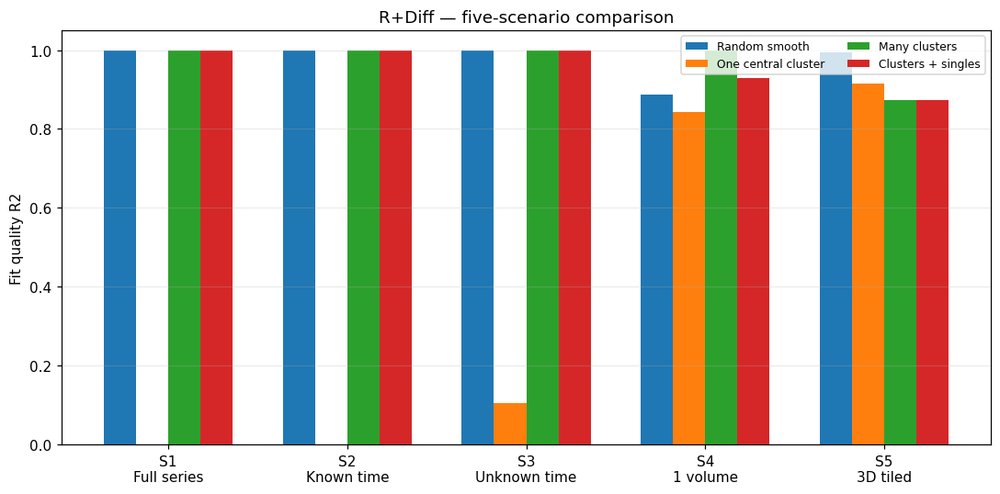

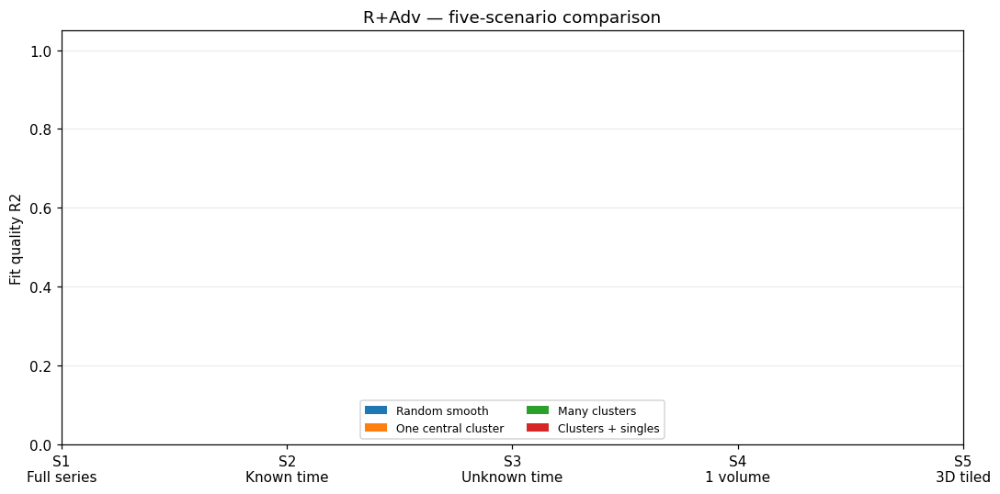

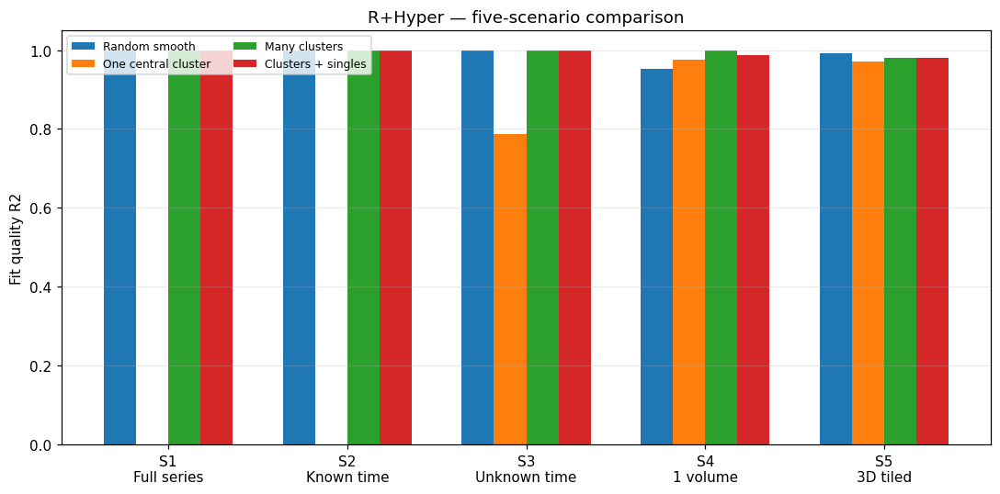

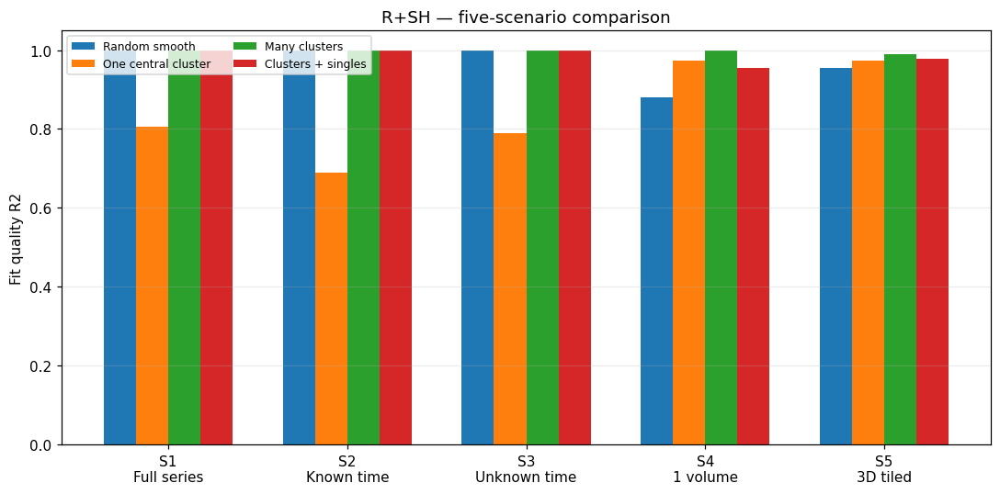

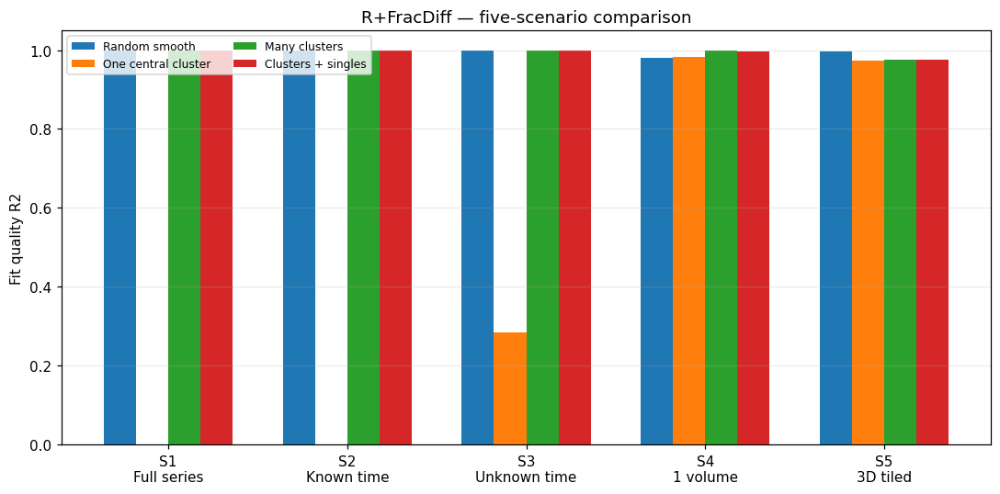

...

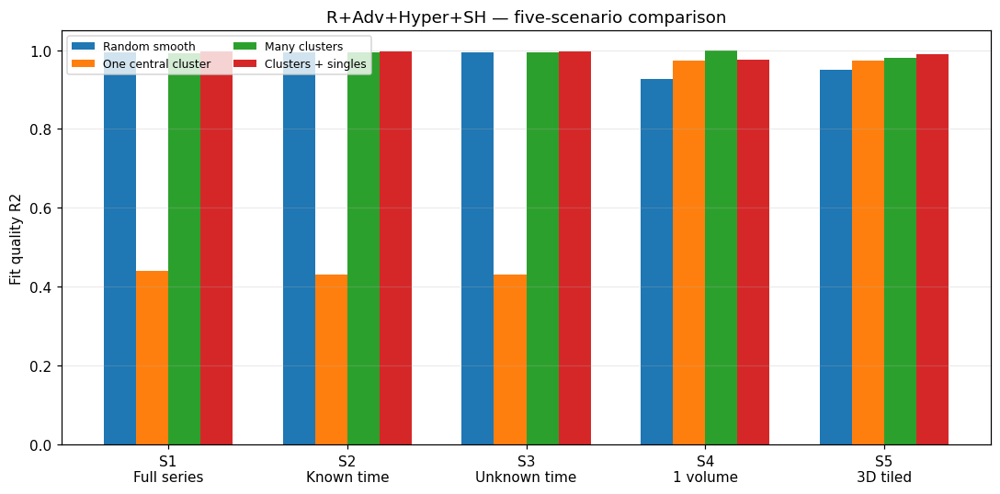

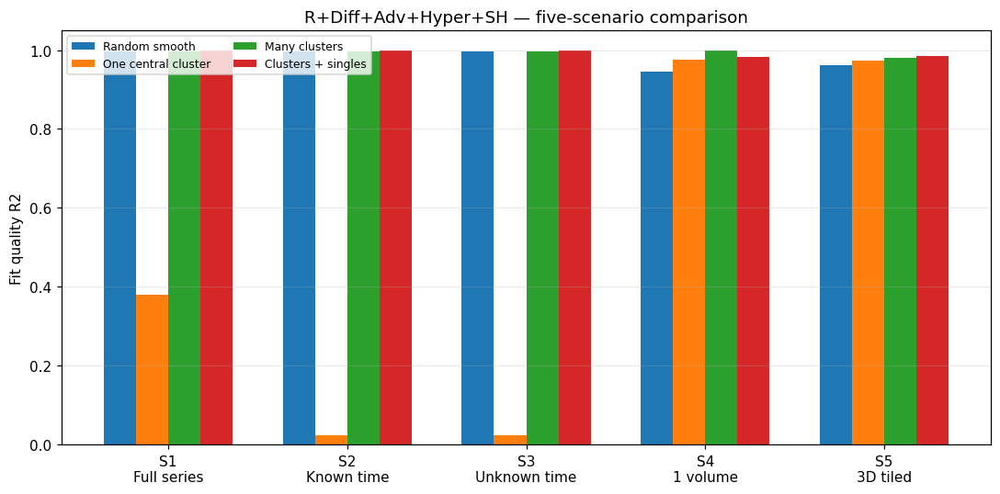

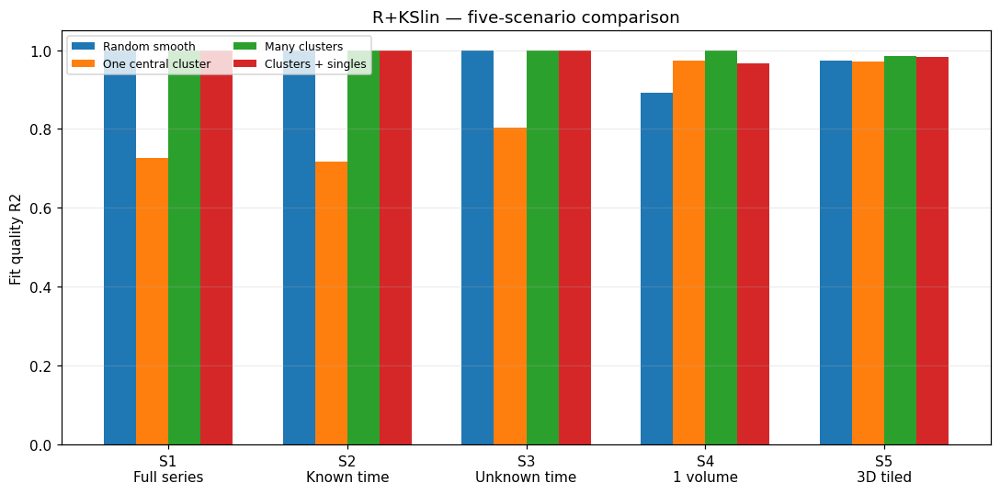

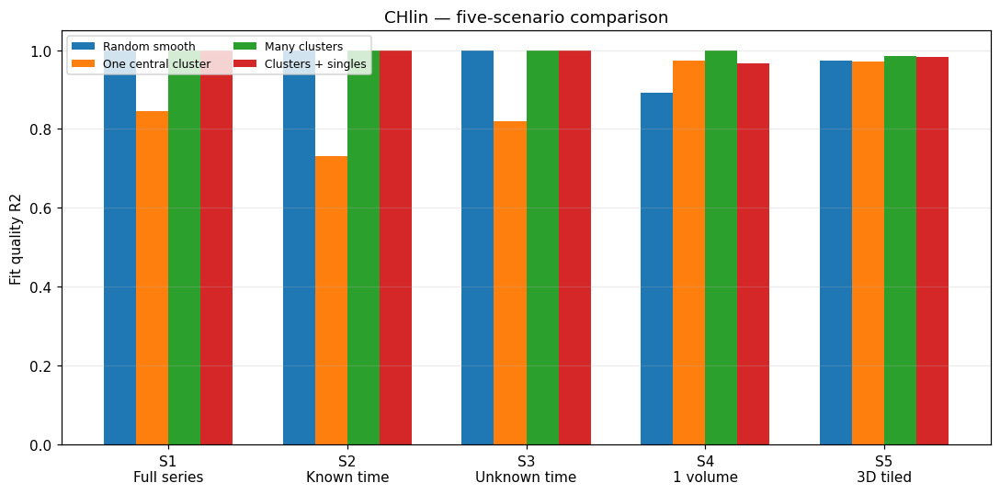

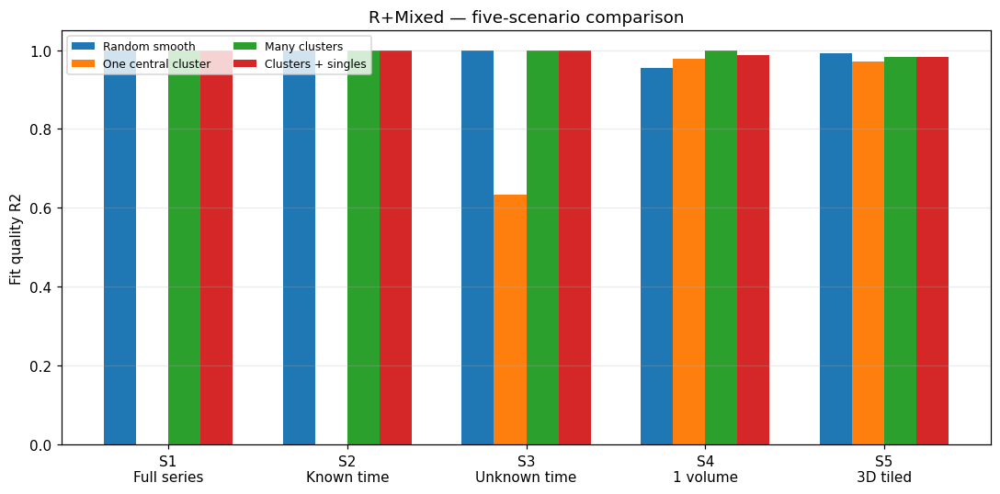

In [16]:

FIVE_SCENARIO_R2_TABLES={}

for tag,res in ALL_RESULTS.items():
    ic_names=list(ICs)
    scen_names=["S1","S2","S3","S4","S5"]
    table=np.full((4,5),np.nan)

    for i,ic in enumerate(ic_names):
        for j,scen in enumerate(("S1","S2","S3","S4")):
            rr=res[scen].get(ic)
            if rr is not None:
                table[i,j]=rr.get("R2",np.nan)
        rr5=res["S5"].get(ic)
        if rr5 is not None:
            table[i,4]=rr5.get("median_R2",np.nan)

    df=pd.DataFrame(table,index=ic_names,columns=scen_names)
    FIVE_SCENARIO_R2_TABLES[tag]=df

    fig,ax=plt.subplots(figsize=(10,5))
    xloc=np.arange(5)
    width=.18
    offsets=np.linspace(-1.5*width,1.5*width,4)

    for off,ic in zip(offsets,ic_names):
        ax.bar(xloc+off,df.loc[ic].values,width,label=ic)

    ax.set_xticks(xloc)
    ax.set_xticklabels(["S1\nFull series","S2\nKnown time","S3\nUnknown time",
                        "S4\n1 volume","S5\n3D tiled"])
    ax.set_ylim(0,1.05)
    ax.set_ylabel("Fit quality R2")
    ax.set_title(f"{tag} — five-scenario comparison")
    ax.grid(axis="y",alpha=.25)
    ax.legend(fontsize=8,ncol=2)
    plt.tight_layout()
    plt.show()


# 13. Final comparison plots across all PDEs

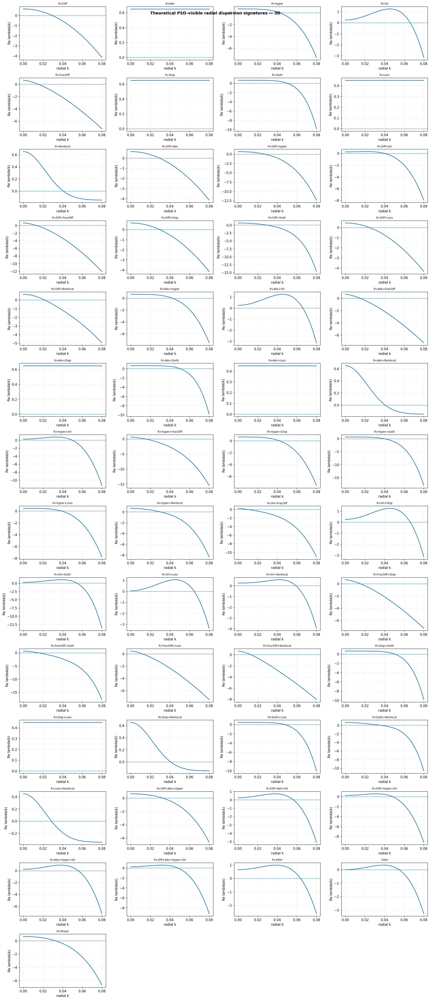

In [17]:

# 13A. Theoretical radial dispersion signatures
n_models=len(MODEL_LIBRARY)
ncols=4
nrows=int(np.ceil(n_models/ncols))
fig,axs=plt.subplots(nrows,ncols,figsize=(18,3.0*nrows))
axs=np.atleast_1d(axs).ravel()
kplot=np.linspace(0,0.08,400)

for ax,(tag,spec) in zip(axs,MODEL_LIBRARY.items()):
    ax.plot(kplot,real_symbol_radial(kplot,tag,spec["true"]),linewidth=1.7)
    ax.axhline(0,linewidth=.8)
    ax.set_title(tag,fontsize=8)
    ax.set_xlabel("radial k")
    ax.set_ylabel("Re lambda(k)")
    ax.grid(alpha=.2)

for ax in axs[n_models:]:
    ax.axis("off")

fig.suptitle("Theoretical PSD-visible radial dispersion signatures — 3D",fontweight="bold")
plt.tight_layout()
plt.show()


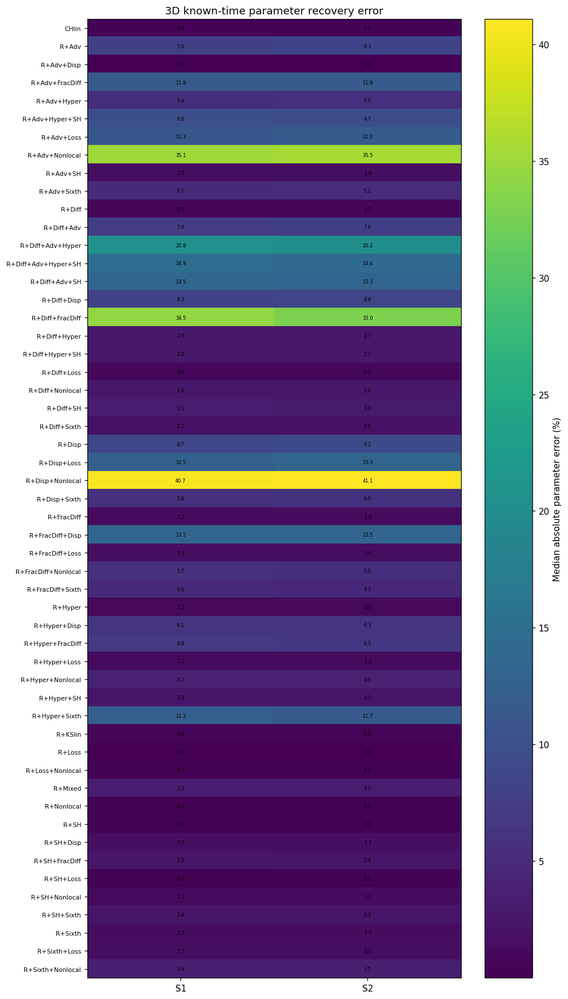

In [18]:

# 13B. S1/S2 known-time parameter recovery error
PARAM_ERROR_DF=(
    MASTER_SUMMARY_DF[MASTER_SUMMARY_DF["Scenario"].isin(["S1","S2"])]
    .groupby(["PDE","Scenario"],as_index=False)["Median abs parameter error (%)"]
    .median()
)

pivot=PARAM_ERROR_DF.pivot(
    index="PDE",columns="Scenario",values="Median abs parameter error (%)"
).reindex(columns=["S1","S2"])

fig,ax=plt.subplots(figsize=(9,max(10,.30*len(pivot))))
im=ax.imshow(pivot.values,aspect="auto")
ax.set_xticks(range(2)); ax.set_xticklabels(["S1","S2"])
ax.set_yticks(range(len(pivot))); ax.set_yticklabels(pivot.index,fontsize=7)

for i in range(pivot.shape[0]):
    for j in range(2):
        v=pivot.iloc[i,j]
        if np.isfinite(v):
            ax.text(j,i,f"{v:.1f}",ha="center",va="center",fontsize=5.5)

fig.colorbar(im,ax=ax,label="Median absolute parameter error (%)")
ax.set_title("3D known-time parameter recovery error")
plt.tight_layout()
plt.show()


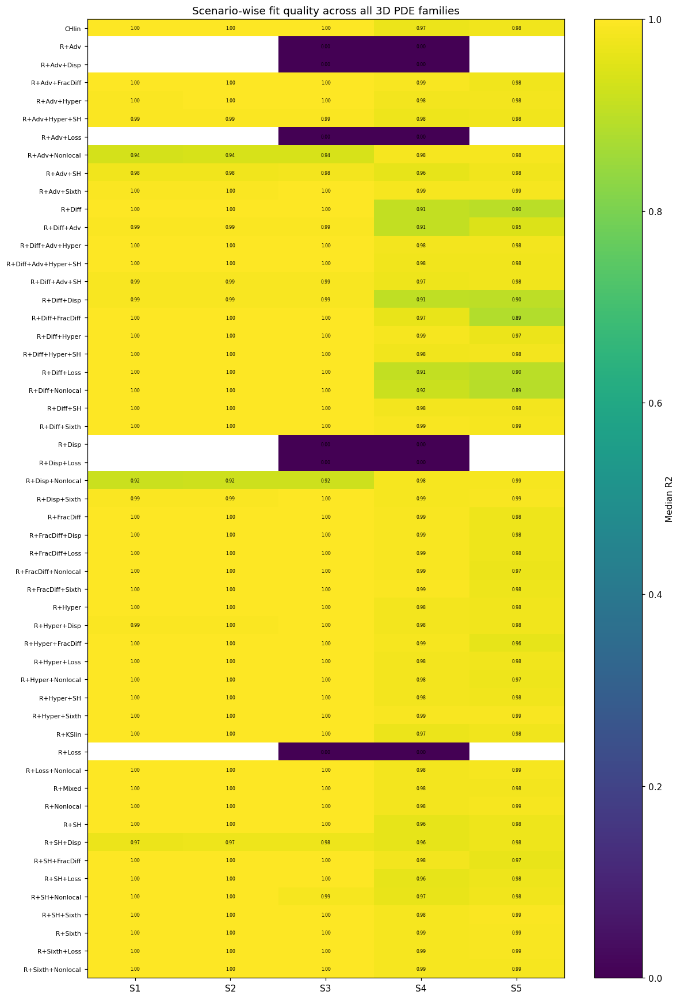

In [19]:

# 13C. Median R2 across the four ICs
R2_MEDIAN_FULL=PDE_SCENARIO_MEDIAN_R2

fig,ax=plt.subplots(figsize=(11,max(10,.30*len(R2_MEDIAN_FULL))))
im=ax.imshow(R2_MEDIAN_FULL.values,aspect="auto",vmin=0,vmax=1)
ax.set_xticks(range(5)); ax.set_xticklabels(["S1","S2","S3","S4","S5"])
ax.set_yticks(range(len(R2_MEDIAN_FULL)))
ax.set_yticklabels(R2_MEDIAN_FULL.index,fontsize=7)

for i in range(R2_MEDIAN_FULL.shape[0]):
    for j in range(5):
        v=R2_MEDIAN_FULL.iloc[i,j]
        if np.isfinite(v):
            ax.text(j,i,f"{v:.2f}",ha="center",va="center",fontsize=5)

fig.colorbar(im,ax=ax,label="Median R2")
ax.set_title("Scenario-wise fit quality across all 3D PDE families")
plt.tight_layout()
plt.show()


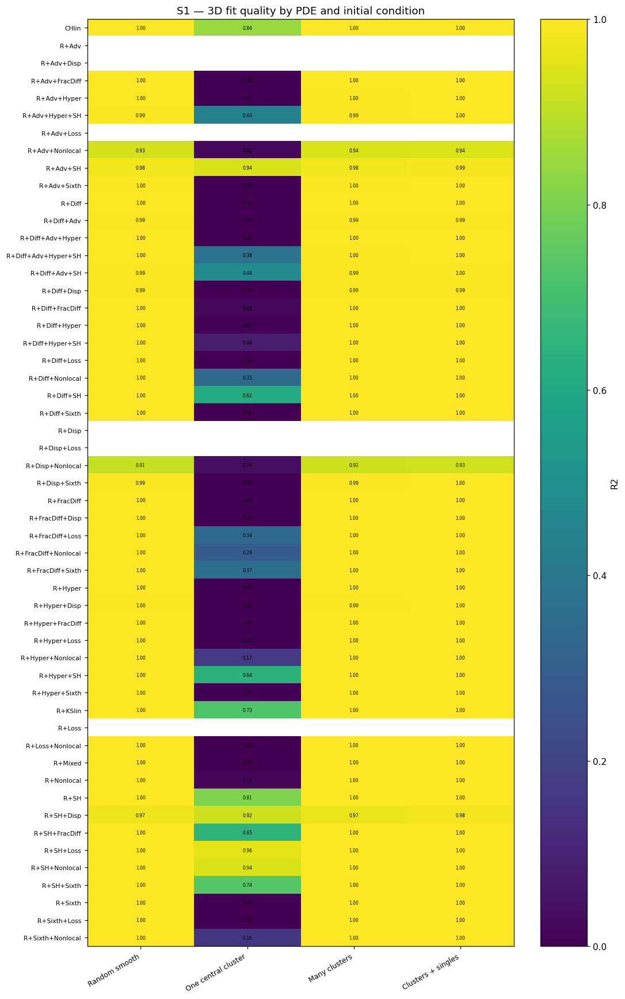

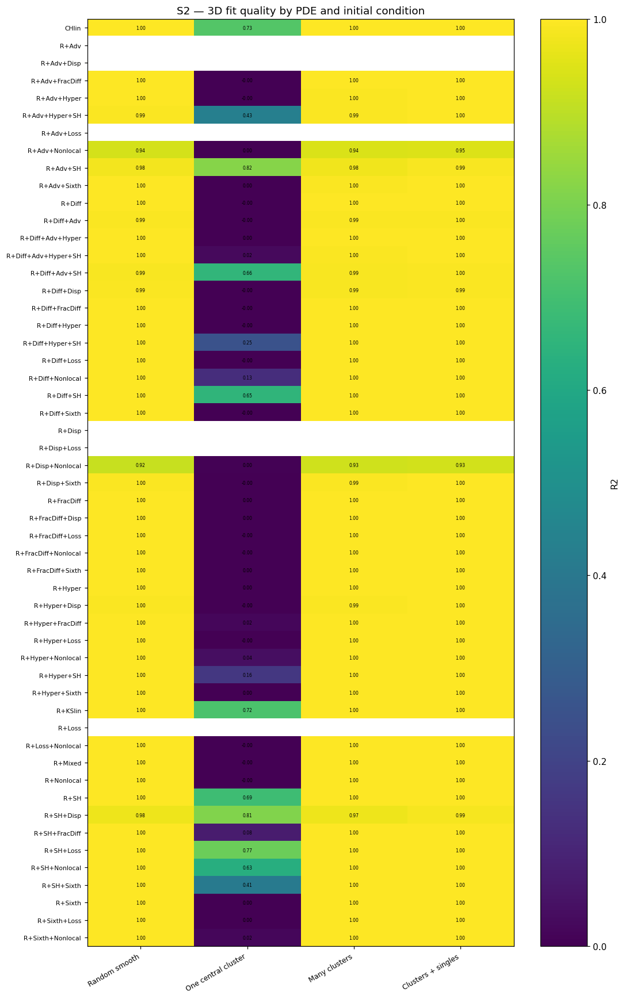

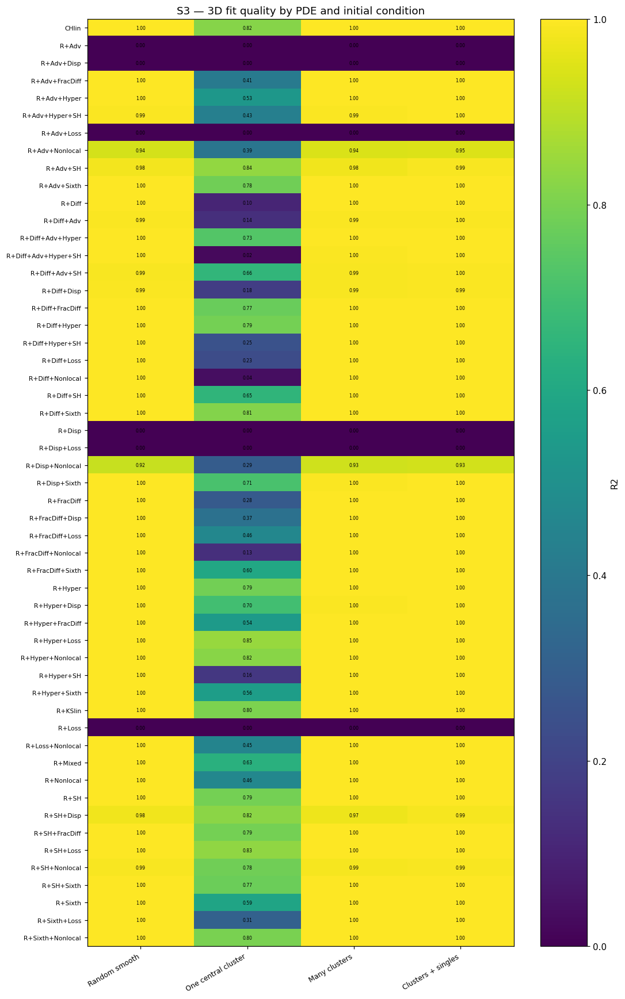

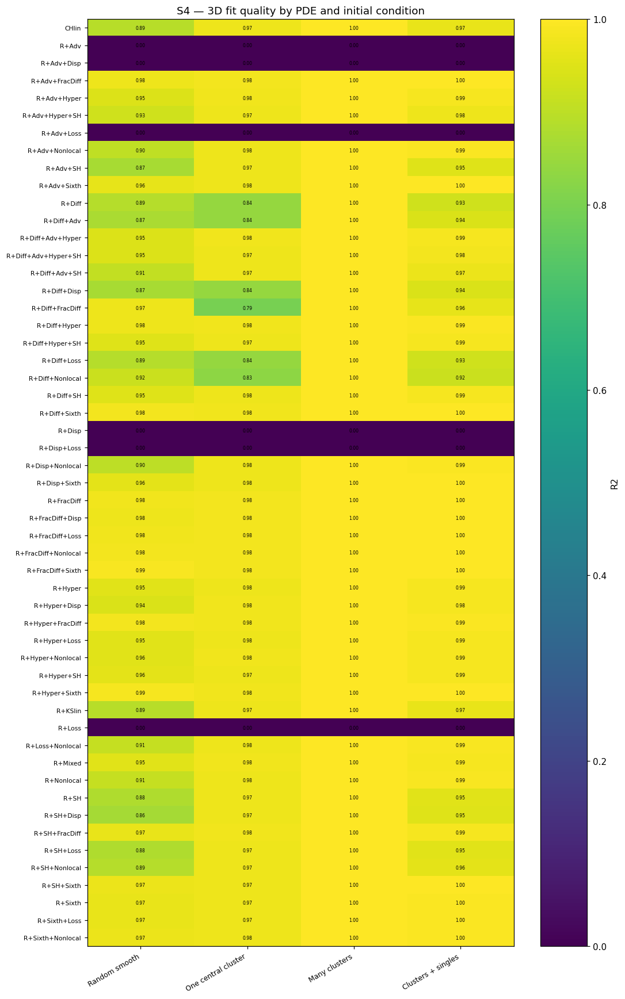

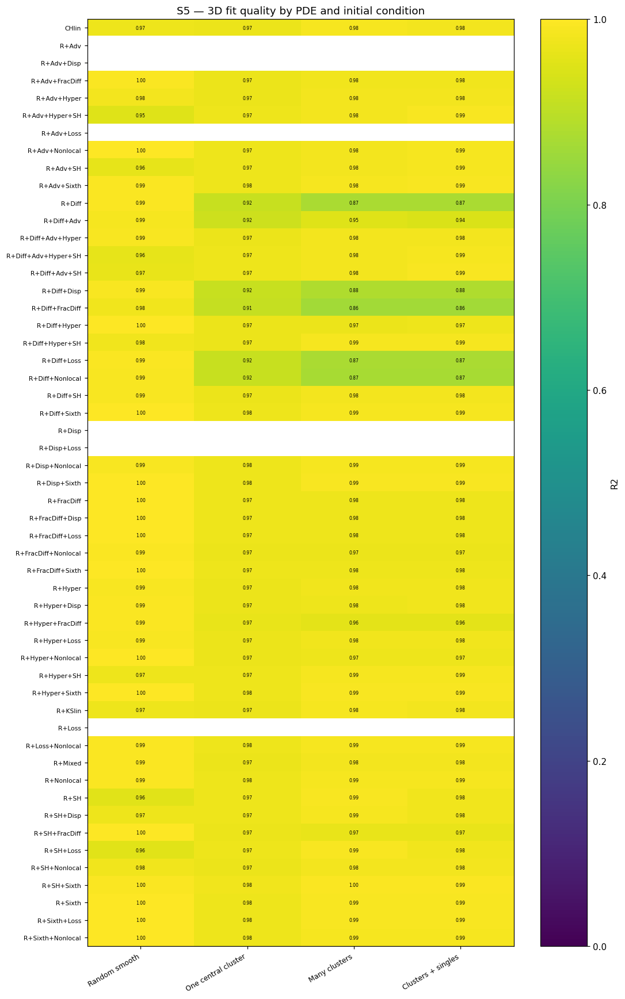

In [20]:

# 13D. One heatmap per scenario
for scen in ["S1","S2","S3","S4","S5"]:
    pivot=MASTER_SUMMARY_DF[
        MASTER_SUMMARY_DF["Scenario"]==scen
    ].pivot(index="PDE",columns="Initial condition",values="R2").reindex(columns=list(ICs))

    fig,ax=plt.subplots(figsize=(10,max(10,.30*len(pivot))))
    im=ax.imshow(pivot.values,aspect="auto",vmin=0,vmax=1)
    ax.set_xticks(range(len(pivot.columns)))
    ax.set_xticklabels(pivot.columns,rotation=30,ha="right",fontsize=8)
    ax.set_yticks(range(len(pivot)))
    ax.set_yticklabels(pivot.index,fontsize=7)

    for i in range(pivot.shape[0]):
        for j in range(pivot.shape[1]):
            v=pivot.iloc[i,j]
            if np.isfinite(v):
                ax.text(j,i,f"{v:.2f}",ha="center",va="center",fontsize=5)

    fig.colorbar(im,ax=ax,label="R2")
    ax.set_title(f"{scen} — 3D fit quality by PDE and initial condition")
    plt.tight_layout()
    plt.show()


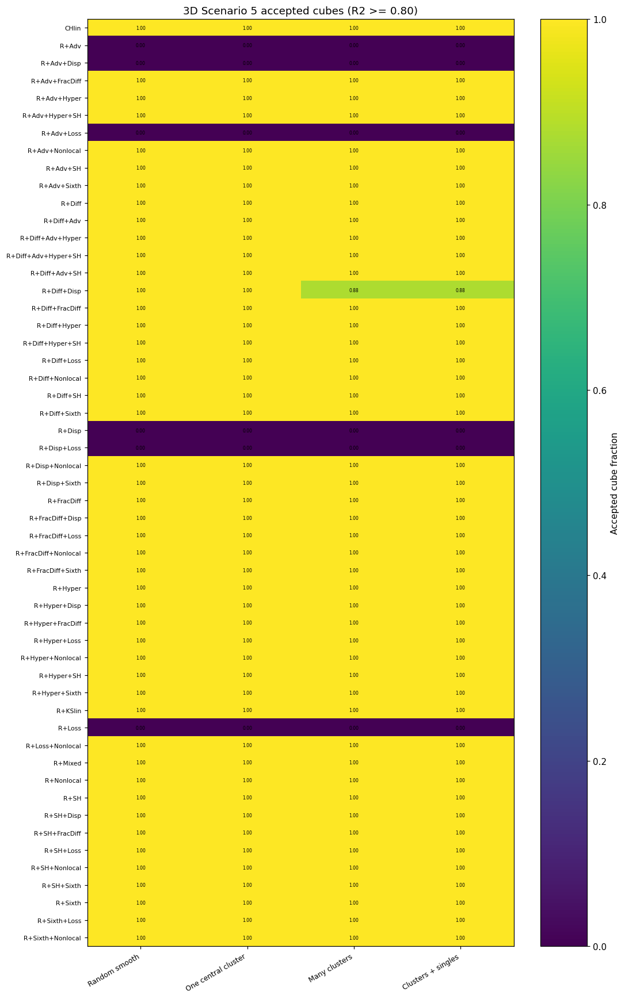

In [21]:

# 13E. Scenario 5 accepted-cube fractions
rows=[]
for tag,res in ALL_RESULTS.items():
    for ic,rr in res["S5"].items():
        frac=rr["n_good"]/rr["n_total"] if rr is not None and rr["n_total"] else np.nan
        rows.append({"PDE":tag,"Initial condition":ic,"Accepted fraction":frac})

S5_ACCEPT_DF=pd.DataFrame(rows)
pivot=S5_ACCEPT_DF.pivot(
    index="PDE",columns="Initial condition",values="Accepted fraction"
).reindex(columns=list(ICs))

fig,ax=plt.subplots(figsize=(10,max(10,.30*len(pivot))))
im=ax.imshow(pivot.values,aspect="auto",vmin=0,vmax=1)
ax.set_xticks(range(len(pivot.columns)))
ax.set_xticklabels(pivot.columns,rotation=30,ha="right",fontsize=8)
ax.set_yticks(range(len(pivot)))
ax.set_yticklabels(pivot.index,fontsize=7)

for i in range(pivot.shape[0]):
    for j in range(pivot.shape[1]):
        v=pivot.iloc[i,j]
        if np.isfinite(v):
            ax.text(j,i,f"{v:.2f}",ha="center",va="center",fontsize=5)

fig.colorbar(im,ax=ax,label="Accepted cube fraction")
ax.set_title(f"3D Scenario 5 accepted cubes (R2 >= {R2_MIN:.2f})")
plt.tight_layout()
plt.show()


In [22]:

# 13F. Scenario-specific ranking tables
SCENARIO_RANKINGS={}

for scen in ["S1","S2","S3","S4","S5"]:
    rank=(
        MASTER_SUMMARY_DF[MASTER_SUMMARY_DF["Scenario"]==scen]
        .groupby("PDE",as_index=False)["R2"]
        .median()
        .rename(columns={"R2":"Median_R2"})
        .sort_values("Median_R2",ascending=False)
        .reset_index(drop=True)
    )
    rank["Rank"]=np.arange(1,len(rank)+1)
    SCENARIO_RANKINGS[scen]=rank[["Rank","PDE","Median_R2"]]
    print(f"\n{scen} top 20:")
    display(SCENARIO_RANKINGS[scen].head(20))



S1 top 20:


,Rank,PDE,Median_R2
0,1,R+Loss+Nonlocal,0.999991
1,2,R+Nonlocal,0.999991
2,3,R+FracDiff+Nonlocal,0.999980
3,4,R+Diff+Nonlocal,0.999972
4,5,R+FracDiff+Loss,0.999965
5,6,R+FracDiff,0.999965
6,7,R+Diff+FracDiff,0.999960
7,8,R+Diff+Loss,0.999934
8,9,R+Diff,0.999934
9,10,R+Hyper+FracDiff,0.999911



S2 top 20:


,Rank,PDE,Median_R2
0,1,R+Loss+Nonlocal,0.999991
1,2,R+Nonlocal,0.999991
2,3,R+FracDiff+Nonlocal,0.999981
3,4,R+Diff+Nonlocal,0.999972
4,5,R+FracDiff+Loss,0.999966
5,6,R+FracDiff,0.999966
6,7,R+Diff+FracDiff,0.999963
7,8,R+Diff+Loss,0.999935
8,9,R+Diff,0.999935
9,10,R+Hyper+FracDiff,0.999918



S3 top 20:


,Rank,PDE,Median_R2
0,1,R+Loss+Nonlocal,0.999991
1,2,R+Nonlocal,0.999991
2,3,R+Diff+Nonlocal,0.999972
3,4,R+FracDiff+Loss,0.999966
4,5,R+FracDiff,0.999966
5,6,R+FracDiff+Nonlocal,0.999964
6,7,R+Diff+FracDiff,0.999963
7,8,R+Diff+Loss,0.999935
8,9,R+Diff,0.999935
9,10,R+Hyper+FracDiff,0.999918



S4 top 20:


,Rank,PDE,Median_R2
0,1,R+FracDiff+Sixth,0.993687
1,2,R+Hyper+Sixth,0.991798
2,3,R+FracDiff+Nonlocal,0.990674
3,4,R+Diff+Sixth,0.990532
4,5,R+FracDiff+Disp,0.990437
5,6,R+Adv+FracDiff,0.990333
6,7,R+FracDiff+Loss,0.989635
7,8,R+FracDiff,0.989631
8,9,R+Hyper+FracDiff,0.987546
9,10,R+Disp+Sixth,0.986396



S5 top 20:


,Rank,PDE,Median_R2
0,1,R+SH+Sixth,0.994566
1,2,R+Disp+Sixth,0.990959
2,3,R+Sixth,0.990728
3,4,R+Sixth+Loss,0.990728
4,5,R+Hyper+Sixth,0.990121
5,6,R+Disp+Nonlocal,0.986812
6,7,R+Adv+Sixth,0.986787
7,8,R+Nonlocal,0.986660
8,9,R+Loss+Nonlocal,0.986660
9,10,R+Sixth+Nonlocal,0.986560



# 14. Interpretation and 3D cautions

- **S1:** full time-series radial PSD recovery.
- **S2:** two-volume radial PSD ratio with known elapsed time.
- **S3:** unknown-time ratios / shape information.
- **S4:** one-volume radial spectral-shape diagnostic only.
- **S5:** local cubic-tile spectral diagnostic. Only accepted cubes are used in the S5 summary.
- Radial averaging is natural for **isotropic** operators, but it discards directional information.
- \(x\)-directed advection and third-order dispersion remain phase-only and are therefore not identifiable from PSD magnitude.
- If experimental 3D data are anisotropic, use \(P(k_x,k_y,k_z)\), directional spectra, or angular sectors instead of relying only on spherical-shell averaging.
- FFT evolution assumes periodic boundaries. Experimental microscopy volumes may require detrending, tapering/windowing, or interior ROI selection before direct Fourier interpretation.
- Scenario 5 remains a robustness diagnostic; local tiling does not prove that unknown initial-spectrum bias vanishes.


# 15. Export all summary tables

In [23]:

MASTER_SUMMARY_DF.to_csv("MASTER_3D_ALL_PDEs_ALL_5_SCENARIOS_tidy.csv",index=False)
MASTER_R2_MATRIX.to_csv("MASTER_3D_ALL_PDEs_R2_matrix.csv")
PDE_SCENARIO_MEDIAN_R2.to_csv("MASTER_3D_PDE_scenario_median_R2.csv")
PARAM_ERROR_DF.to_csv("MASTER_3D_known_time_parameter_error.csv",index=False)
S5_ACCEPT_DF.to_csv("MASTER_3D_S5_accepted_cube_fraction.csv",index=False)
S5_RD_GRID_DF.to_csv("MASTER_3D_S5_RD_grid_sweep.csv",index=False)

for scen,df in SCENARIO_RANKINGS.items():
    df.to_csv(f"MASTER_3D_{scen}_ranking.csv",index=False)

print("Saved all 3D summary CSV files.")


Saved all 3D summary CSV files.
